In [ ]:
# for your info:

# the location of data on cluster:
# scripts/ data/ nim_fmri_nemo__/ sub_0001/ net_series_t0_1.txt >>> run1 with threshold of 0



# 1:21 latchers

# remained people are explorers

# Packages loading

In [109]:
import numpy as np
import itertools
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.linear_model import LinearRegression

import pylab
import random


# !pip install networkx
import numpy as np
import networkx as nx

import matplotlib.pyplot as plt

import seaborn as sns


# Data uploading

In [489]:
# from google.colab import drive
# # drive.mount('/content/drive')
# drive.mount("/content/drive", force_remount=True)



#FOR COLAB:
import pandas as pd
import numpy as np
import scipy.io as sio
from google.colab import files


uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(  name=fn, length=len(uploaded[fn])))

Saving tmeanrun_4_networks_concat.csv to tmeanrun_4_networks_concat.csv
User uploaded file "tmeanrun_4_networks_concat.csv" with length 196280 bytes


In [490]:





datafilename = 'tmeanrun_4_networks_concat.csv'






if datafilename == 'tmeanrun_1_networks_concat.csv':


    RUN_number = 'Rest1'

elif datafilename == 'tmeanrun_2_networks_concat.csv':

      RUN_number = 'Game1'



elif datafilename == 'tmeanrun_3_networks_concat.csv':


    RUN_number = 'Game2'


elif datafilename == 'tmeanrun_4_networks_concat.csv':


    RUN_number = 'Rest2'

RUN_number





df = pd.read_csv(datafilename)#"t0_1_networks_concat.csv")  t0_4_networks_concat.csv
# df
DATA_LATCHERS = df[df['Type']=='Latchers']
DATA_LATCHERS = DATA_LATCHERS.iloc[:, [1,2,3,4,5,6,7,8]]
DATA_LATCHERS
DATA_LATCHERS = DATA_LATCHERS.reset_index().drop(['index'],axis=1).copy()




DATA_EXPLORERS = df[df['Type']=='Explorers']
DATA_EXPLORERS = DATA_EXPLORERS.iloc[:, [1,2,3,4,5,6,7,8]]
DATA_EXPLORERS
DATA_EXPLORERS = DATA_EXPLORERS.reset_index().drop(['index'],axis=1).copy()


# # df = pd.read_csv("Explorers_rest1.csv")





df = df.iloc[:, [1,2,3,4,5,6,7,8]]





l_t = len(df)
l_t_LATCHER = len(DATA_LATCHERS)


l_t_EXPLORER = len(DATA_EXPLORERS)


df

,0,1,2,3,4,5,6,7
0,1,1,1,0,0,0,0,0
1,1,1,0,0,1,1,0,1
2,0,0,1,1,1,0,1,0
3,0,0,0,0,0,1,0,0
4,1,0,0,1,1,1,0,0
...,...,...,...,...,...,...,...,...
5950,1,0,0,0,0,0,0,0
5951,0,1,0,0,0,1,0,0
5952,1,1,0,0,0,1,1,0
5953,1,1,1,1,1,1,1,0


In [491]:
DATA_LATCHERS

,0,1,2,3,4,5,6,7
0,1,1,1,0,0,0,0,0
1,1,1,0,0,1,1,0,1
2,0,0,1,1,1,0,1,0
3,0,0,0,0,0,1,0,0
4,1,0,0,1,1,1,0,0
...,...,...,...,...,...,...,...,...
3570,1,0,0,0,0,1,0,1
3571,1,1,0,1,1,1,0,1
3572,1,1,1,0,1,1,1,1
3573,0,1,1,0,1,0,0,1


In [492]:
DATA_EXPLORERS

,0,1,2,3,4,5,6,7
0,0,1,0,1,0,1,1,1
1,0,0,0,0,1,0,1,1
2,0,0,0,1,1,1,1,0
3,0,0,0,0,1,1,1,1
4,0,0,1,1,1,0,1,1
...,...,...,...,...,...,...,...,...
2375,1,0,0,0,0,0,0,0
2376,0,1,0,0,0,1,0,0
2377,1,1,0,0,0,1,1,0
2378,1,1,1,1,1,1,1,0


In [493]:
# replicated data for latchers and explorers
'''



DATA_LATCHERS = pd.concat([DATA_LATCHERS, DATA_LATCHERS], ignore_index=True)





DATA_EXPLORERS = pd.concat([DATA_EXPLORERS, DATA_EXPLORERS, DATA_EXPLORERS], ignore_index=True)'''


'\n\n\n\nDATA_LATCHERS = pd.concat([DATA_LATCHERS, DATA_LATCHERS], ignore_index=True)\n\n\n\n\n\nDATA_EXPLORERS = pd.concat([DATA_EXPLORERS, DATA_EXPLORERS, DATA_EXPLORERS], ignore_index=True)'

In [494]:
df

,0,1,2,3,4,5,6,7
0,1,1,1,0,0,0,0,0
1,1,1,0,0,1,1,0,1
2,0,0,1,1,1,0,1,0
3,0,0,0,0,0,1,0,0
4,1,0,0,1,1,1,0,0
...,...,...,...,...,...,...,...,...
5950,1,0,0,0,0,0,0,0
5951,0,1,0,0,0,1,0,0
5952,1,1,0,0,0,1,1,0
5953,1,1,1,1,1,1,1,0


In [495]:
data_p = df.T
data_p

,0,1,2,3,4,5,6,7,8,9,...,5945,5946,5947,5948,5949,5950,5951,5952,5953,5954
0,1,1,0,0,1,1,1,1,1,1,...,0,0,1,1,1,1,0,1,1,0
1,1,1,0,0,0,0,0,0,0,0,...,1,0,1,1,0,0,1,1,1,1
2,1,0,1,0,0,0,0,1,1,1,...,1,0,0,0,0,0,0,0,1,0
3,0,0,1,0,1,1,1,1,1,1,...,0,0,0,1,1,0,0,0,1,0
4,0,1,1,0,1,1,1,1,1,1,...,1,0,1,1,0,0,0,0,1,1
5,0,1,0,1,1,1,1,1,1,1,...,0,0,1,1,1,0,1,1,1,0
6,0,0,1,0,0,1,0,1,0,1,...,0,1,1,1,1,0,0,1,1,0
7,0,1,0,0,0,1,1,1,1,1,...,1,1,0,0,0,0,0,0,0,1


In [496]:
data_p = np.array(data_p)
np.shape(data_p)
l_t = len(data_p.T)
ROI = 8
np.shape(data_p) #format of data must be ROI*t


(8, 5955)

In [497]:
data = data_p.T
data

array([[1, 1, 1, ..., 0, 0, 0],
       [1, 1, 0, ..., 1, 0, 1],
       [0, 0, 1, ..., 0, 1, 0],
       ...,
       [1, 1, 0, ..., 1, 1, 0],
       [1, 1, 1, ..., 1, 1, 0],
       [0, 1, 0, ..., 0, 0, 1]])

# H,J estimation

In [498]:



''' run this block, if you consider using function of ENERGY_vector_to_mat



def Hamiltonian(sigma_vec, h_vec, J_mat):



      first_term = np.dot(  h_vec , sigma_vec)

      # print('first term is' , first_term)


      second_term = 0

      N = len(sigma_vec)

      for i in range(N):
        for j in range(i+1, N):

          second_term = second_term + (sigma_vec[i] * sigma_vec[j] * J_mat[i,j])
          # print(i,j)

      second_term2 =   second_term


      energy = -(first_term + second_term2)
      # print(energy )

      return(energy)




sigma = [0,1]
V = np.array(list(itertools.product(sigma, repeat = ROI))) #(2^ROI, ROI)

V




def ENERGY_vector_to_mat(V,h_vec, J_mat):
    H = []
    for i in range(0,2** len(h_vec)):

      H.append(Hamiltonian(list(V[i,:]), h_vec, J_mat))

    return(np.array(H))

'''

" run this block, if you consider using function of ENERGY_vector_to_mat\n\n\n\ndef Hamiltonian(sigma_vec, h_vec, J_mat):\n\n\n\n      first_term = np.dot(  h_vec , sigma_vec)\n\n      # print('first term is' , first_term)\n\n\n      second_term = 0\n\n      N = len(sigma_vec)\n\n      for i in range(N):\n        for j in range(i+1, N):\n\n          second_term = second_term + (sigma_vec[i] * sigma_vec[j] * J_mat[i,j])\n          # print(i,j)\n\n      second_term2 =   second_term\n\n\n      energy = -(first_term + second_term2)\n      # print(energy )\n\n      return(energy)\n\n\n\n\nsigma = [0,1]\nV = np.array(list(itertools.product(sigma, repeat = ROI))) #(2^ROI, ROI)\n\nV\n\n\n\n\ndef ENERGY_vector_to_mat(V,h_vec, J_mat):\n    H = []\n    for i in range(0,2** len(h_vec)):\n\n      H.append(Hamiltonian(list(V[i,:]), h_vec, J_mat))\n\n    return(np.array(H))\n\n"

In [499]:
'you can change the eps, alpha and beta inside the function.'

def HandJ(data_p, ROI, l_t):

  #parameters
  expected_value = np.zeros(ROI)
  correlation_value = np.zeros((ROI,ROI))
  for i in range(ROI):
    expected_value[i] = np.sum(data_p[i])/l_t #mean for a specific ROI over time, also it is y data
    for j in range(ROI):
      correlation_value[i][j] = np.dot(data_p[i], data_p[j])/l_t


  # print('correlation_value is ', correlation_value)


  eps = 0.000001  # 0.000001 # 0.00000001
  e = 1e-8 #1e-8, 1e-10

  #learning rate
  alpha = 0.1
  beta = alpha

  #initial data
  H_rand = np.array([1,1,1,1,1,1,1,1]) *0.1
  J_rand = np.ones((ROI,ROI)) *0.1
  np.fill_diagonal(J_rand, 0)

  #all possible pattern
  sigma = [0,1]
  V = np.array(list(itertools.product(sigma, repeat = ROI))) #(2^ROI, ROI)





  from scipy.special import softmax


  E_rand =  -1 * np.dot(H_rand, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_rand), V.T))     # ENERGY_vector_to_mat(V,H_rand, J_rand)            #-1 * np.dot(H_rand, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_rand), V.T))


  print(E_rand.shape)





  P_rand = np.exp(-E_rand)/np.sum(np.exp(-E_rand))

  model_expected = np.dot(V.T,P_rand)
  model_corrolation = np.dot(P_rand * V.T, V)
  i = 0
  H_rand_old = np.copy(H_rand)

  #initial condition for starting the while loop.
  cond6 = 100
  cond7 = 100


  # jj = 0

  while cond6 > eps and  cond7 > eps:


    # jj+=1

    H_rand_old = np.copy(H_rand)
    J_rand_old = np.copy(J_rand)

    H_rand +=  alpha * np.log((expected_value / (model_expected + e))) #alpha * (expected_value - model_expected) #alpha * np.log((expected_value / (model_expected + e)))
    J_rand +=  beta * np.log((correlation_value / (model_corrolation + e)))     #beta * (correlation_value -  model_corrolation)  #beta * np.log((correlation_value / (model_corrolation + e)))



    np.fill_diagonal(J_rand, 0)



    E_rand =  -1 * np.dot(H_rand, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_rand), V.T))         #ENERGY_vector_to_mat(V,H_rand, J_rand)           #-1 * np.dot(H_rand, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_rand), V.T))




    P_rand = np.exp(-E_rand)/np.sum(np.exp(-E_rand) )
    model_expected = np.dot(V.T,P_rand)
    model_corrolation = np.dot(P_rand * V.T, V)

    # cond4 = np.sum(abs(alpha  * np.log(((model_expected+e)/(expected_value)))))/8
    cond6 = np.sum(abs((H_rand-H_rand_old)))/8
    cond7 = np.sum(abs(J_rand-J_rand_old))/64



    # if jj%1000 == 0 :

    #   print('cond 6, 7 and eps are: ',  cond6, cond7 ,eps)


  return H_rand, J_rand

In [500]:



H_rand, J_rand = HandJ(np.array(data_p), ROI, l_t)



H_latcher, J_latcher = HandJ(np.array(DATA_LATCHERS.T), ROI, l_t_LATCHER)


H_explorers, J_explorers = HandJ(np.array(DATA_EXPLORERS.T), ROI, l_t_EXPLORER)




h_vec, J_mat = H_rand, J_rand #HandJ(data_p, ROI, l_t)[0] # np.array([0,1,0]) ##### call fatemeh's function


(256,)
(256,)
(256,)


(256,)


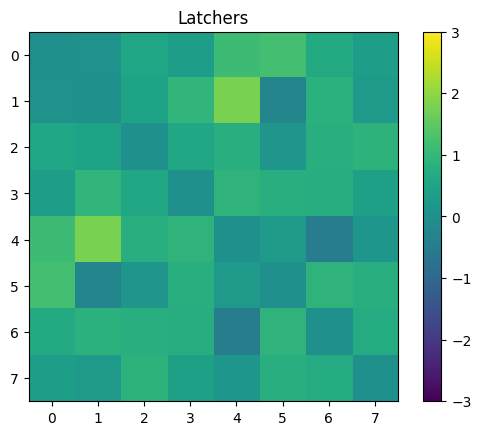

(256,)


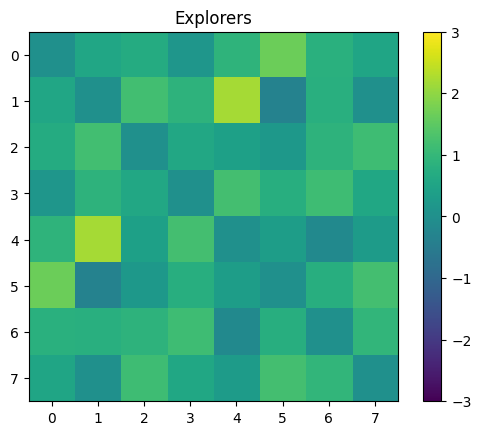

(256,)


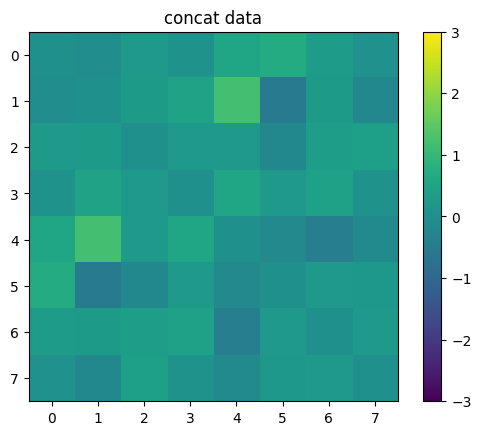

In [501]:
###### here we first define the fixed color range
vmin = -3
vmax = 3

plt.imshow(HandJ(np.array(DATA_LATCHERS.T), ROI, l_t)[1], vmin=vmin, vmax=vmax)
plt.title('Latchers')
plt.colorbar()
plt.show()








# Plot for Explorers with fixed color range
plt.figure()
plt.title('Explorers')
plt.imshow(HandJ(np.array(DATA_EXPLORERS.T), ROI, l_t)[1], vmin=vmin, vmax=vmax)
plt.colorbar()
plt.show()










plt.figure()
plt.title('concat data')
plt.imshow(HandJ(np.array(data_p), ROI, l_t)[1], vmin=vmin, vmax=vmax)
plt.colorbar()
plt.show()


# Frequency computation

In [502]:



'''
def Hamiltonian(sigma_vec, h_vec, J_mat):



      first_term = np.dot(  h_vec , sigma_vec)

      # print('first term is' , first_term)


      second_term = 0

      N = len(sigma_vec)

      for i in range(N):
        for j in range(i+1, N):

          second_term = second_term + (sigma_vec[i] * sigma_vec[j] * J_mat[i,j])
          # print(i,j)

      second_term2 =   second_term


      energy = -(first_term + second_term2)
      # print(energy )

      return(energy)


'''

"\ndef Hamiltonian(sigma_vec, h_vec, J_mat):\n\n\n\n      first_term = np.dot(  h_vec , sigma_vec)\n\n      # print('first term is' , first_term)\n\n\n      second_term = 0\n\n      N = len(sigma_vec)\n\n      for i in range(N):\n        for j in range(i+1, N):\n\n          second_term = second_term + (sigma_vec[i] * sigma_vec[j] * J_mat[i,j])\n          # print(i,j)\n\n      second_term2 =   second_term\n\n\n      energy = -(first_term + second_term2)\n      # print(energy )\n\n      return(energy)\n\n\n"

In [503]:
J_mat.T == J_mat

array([[ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True],
       [ True,  True,  True,  True,  True,  True,  True,  True]])

In [504]:
import pandas as pd
from collections import Counter


def data_frequency_probability(ROI,data ):
      # Define the 256 patterns, here len(h_vec) is 8 as we considered 8 networks
      patterns = [format(i, '07b') for i in range(2** ROI)]

      # Convert the dataframe to a list of tuples, where each tuple represents a row (sample)
      samples = [tuple(row) for _, row in pd.DataFrame(data).iterrows()]

      # Count the occurrences of each pattern using Counter
      pattern_frequency = Counter(samples)



      P_DATA = {}
      # Print the frequency count for each pattern
      for pattern, count in pattern_frequency.items():
          # print(f"Pattern: {pattern}, Frequency: {count}")
          # print('the pattern is ', str(pattern))

          # p = list(pattern)
          P_DATA[pattern] = count / len(data)



      return(P_DATA,pattern_frequency)



P_DATA, pattern_frequency = data_frequency_probability(ROI,data )



P_DATA_LATCHER, pattern_frequency_LATCHER = data_frequency_probability(ROI,DATA_LATCHERS )

P_DATA_EXPLORER, pattern_frequency_EXPLORER = data_frequency_probability(ROI,DATA_EXPLORERS )




In [505]:

P_DATA



P_DATA_EXPLORER

P_DATA_LATCHER

{(1, 1, 1, 0, 0, 0, 0, 0): 0.001958041958041958,
 (1, 1, 0, 0, 1, 1, 0, 1): 0.0044755244755244755,
 (0, 0, 1, 1, 1, 0, 1, 0): 0.0033566433566433566,
 (0, 0, 0, 0, 0, 1, 0, 0): 0.012307692307692308,
 (1, 0, 0, 1, 1, 1, 0, 0): 0.005314685314685315,
 (1, 0, 0, 1, 1, 1, 1, 1): 0.003916083916083916,
 (1, 0, 0, 1, 1, 1, 0, 1): 0.004755244755244755,
 (1, 0, 1, 1, 1, 1, 1, 1): 0.008671328671328672,
 (1, 0, 1, 1, 1, 1, 0, 1): 0.0044755244755244755,
 (1, 1, 1, 1, 0, 1, 1, 1): 0.005314685314685315,
 (1, 0, 0, 0, 0, 0, 1, 0): 0.005314685314685315,
 (1, 1, 1, 1, 1, 0, 1, 1): 0.007832167832167832,
 (0, 0, 0, 0, 0, 0, 0, 0): 0.013426573426573427,
 (1, 1, 0, 0, 0, 1, 0, 0): 0.0022377622377622378,
 (0, 0, 0, 0, 0, 0, 1, 0): 0.006153846153846154,
 (0, 0, 0, 1, 1, 1, 1, 1): 0.0016783216783216783,
 (0, 0, 1, 0, 0, 1, 1, 1): 0.007272727272727273,
 (0, 1, 1, 0, 1, 0, 1, 1): 0.004195804195804196,
 (0, 1, 1, 1, 1, 0, 0, 1): 0.008391608391608392,
 (0, 1, 1, 1, 0, 0, 0, 0): 0.003076923076923077,
 (0, 1, 1, 1, 1

In [506]:
pattern_frequency

Counter({(1, 1, 1, 0, 0, 0, 0, 0): 12,
         (1, 1, 0, 0, 1, 1, 0, 1): 25,
         (0, 0, 1, 1, 1, 0, 1, 0): 19,
         (0, 0, 0, 0, 0, 1, 0, 0): 76,
         (1, 0, 0, 1, 1, 1, 0, 0): 31,
         (1, 0, 0, 1, 1, 1, 1, 1): 24,
         (1, 0, 0, 1, 1, 1, 0, 1): 28,
         (1, 0, 1, 1, 1, 1, 1, 1): 46,
         (1, 0, 1, 1, 1, 1, 0, 1): 25,
         (1, 1, 1, 1, 0, 1, 1, 1): 36,
         (1, 0, 0, 0, 0, 0, 1, 0): 29,
         (1, 1, 1, 1, 1, 0, 1, 1): 54,
         (0, 0, 0, 0, 0, 0, 0, 0): 83,
         (1, 1, 0, 0, 0, 1, 0, 0): 19,
         (0, 0, 0, 0, 0, 0, 1, 0): 37,
         (0, 0, 0, 1, 1, 1, 1, 1): 15,
         (0, 0, 1, 0, 0, 1, 1, 1): 39,
         (0, 1, 1, 0, 1, 0, 1, 1): 28,
         (0, 1, 1, 1, 1, 0, 0, 1): 47,
         (0, 1, 1, 1, 0, 0, 0, 0): 14,
         (0, 1, 1, 1, 1, 0, 1, 0): 56,
         (1, 1, 1, 0, 0, 0, 1, 1): 17,
         (0, 0, 0, 0, 1, 1, 1, 0): 9,
         (0, 0, 0, 0, 1, 1, 0, 0): 28,
         (1, 0, 1, 0, 1, 1, 0, 1): 23,
         (1, 1, 1, 1, 0, 1

In [507]:
np.array(list(P_DATA.values())).sum()


np.array(list(P_DATA_EXPLORER.values())).sum()

np.array(list(P_DATA_LATCHER.values())).sum()


1.0

In [508]:

np.array(list(pattern_frequency.values())).sum()

np.array(list(pattern_frequency_EXPLORER.values())).sum()


np.array(list(pattern_frequency_LATCHER.values())).sum()



3575

In [509]:
'''

# PATTERNS = np.array()



def generate_combinations(N, h_vec, J_mat):
    n = N #len(vector)
    combinations = []#,np.zeros(2**N)#[]

    for i in range(2**n):
        combination = [0] * n
        for j in range(n):
            if i & (1 << j):
                combination[j] = 1

        combinations.append([combination, Hamiltonian(combination, h_vec, J_mat)])

    return combinations

'''


'\n\n# PATTERNS = np.array()\n\n\n\ndef generate_combinations(N, h_vec, J_mat):\n    n = N #len(vector)\n    combinations = []#,np.zeros(2**N)#[]\n\n    for i in range(2**n):\n        combination = [0] * n\n        for j in range(n):\n            if i & (1 << j):\n                combination[j] = 1\n\n        combinations.append([combination, Hamiltonian(combination, h_vec, J_mat)])\n\n    return combinations\n\n'

In [510]:
for i in range(8):

  for j in range(8):

    if i ==j :
      print(J_rand[i,j])
# J_rand

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [511]:

###### fateme's energy computation:


def generate_combinations(N, h_vec, J_mat):





    sigma = [0,1]
    V = np.array(list(itertools.product(sigma, repeat = ROI)))

    # 'dis_grap is a adjanency matrix of disconectivity graph, E is an array, demonstrating energy of all possible pattern(V)'
    #energ : E(V_k) = -sum_from 1 to ROI(h_i * sigma_i) -0.5 * sum_from 1 to ROI _ sum_from 1 to ROI (J_ij * sigma_i * sigma_j)

    # dis_graph = np.zeros((2**ROI,2**ROI))



    E = np.zeros(2**ROI)

    # H_rand, J_rand = HandJ(data_p, ROI, l_t)
    E = -1 * np.dot(h_vec, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_mat), V.T))

    P = np.exp(-E)/np.sum(np.exp(-E))









    n = N #len(vector)
    combinations = []#,np.zeros(2**N)#[]
    for i in range(2**N):


        combinations.append([list(V[i,:]), E[i]])

    return combinations



#### Frequency VS Patterns

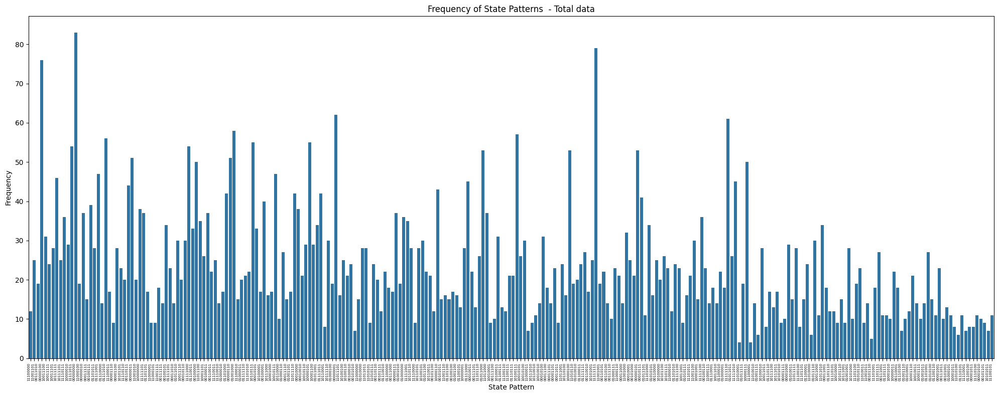

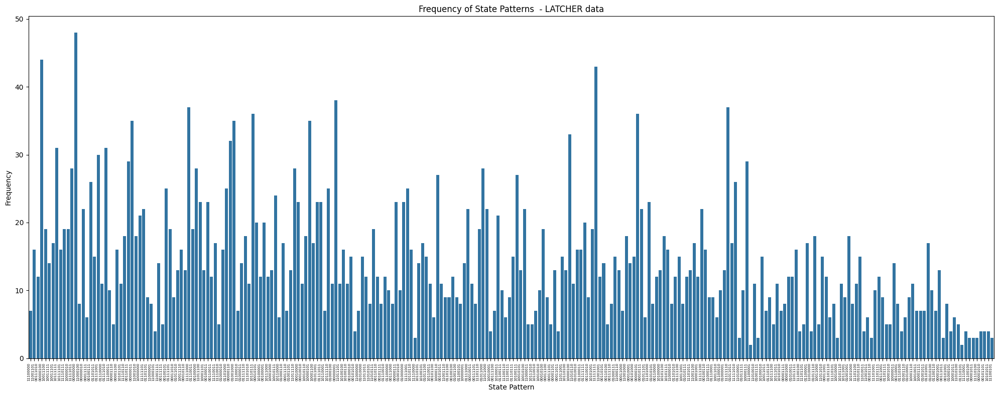

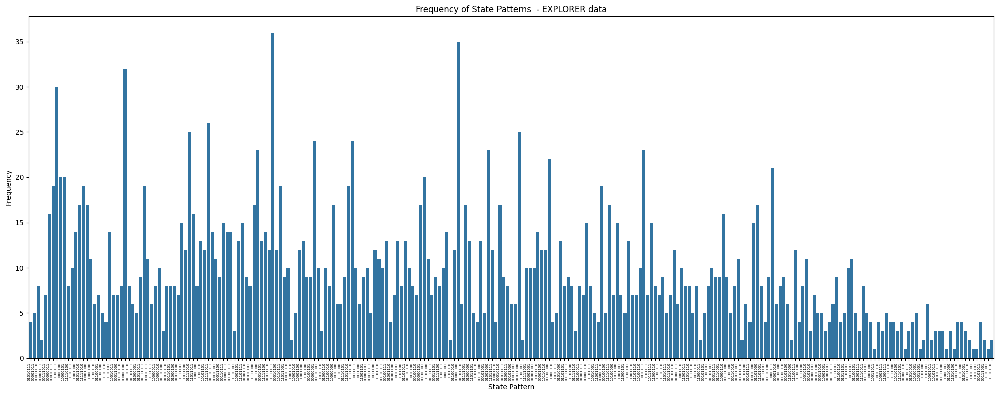

In [512]:

import matplotlib.pyplot as plt
import seaborn as sns

# Extract the patterns and corresponding counts as separate lists
patterns = np.arange(1,1+2**8 )#list(pattern_counts.keys())
counts = list(pattern_frequency.values())




pattern_frequency
pattern_str = [''.join(map(str, key)) for key in pattern_frequency.keys()]
frequencies = list(pattern_frequency.values())


plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str, y=frequencies)


n = 1
plt.xticks(range(0, len(pattern_str), n), pattern_str[::n], rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns  - Total data')

plt.tight_layout()
plt.show()

















counts_LATCHER = list(pattern_frequency_LATCHER.values())
patterns = np.arange(1,1+2**8 )#list(pattern_counts.keys())
counts = list(pattern_frequency.values())




pattern_frequency
pattern_str = [''.join(map(str, key)) for key in pattern_frequency_LATCHER.keys()]
frequencies_LATCHER = list(pattern_frequency_LATCHER.values())


plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str, y=frequencies_LATCHER)


# # working on xticks:
n = 1
plt.xticks(range(0, len(pattern_str), n), pattern_str[::n], rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns  - LATCHER data')

plt.tight_layout()
plt.show()


























counts_EXPLORER = list(pattern_frequency_EXPLORER.values())
pattern_frequency
pattern_str = [''.join(map(str, key)) for key in pattern_frequency_EXPLORER.keys()]
frequencies_EXPLORER = list(pattern_frequency_EXPLORER.values())


plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str, y=frequencies_EXPLORER)


# # working on xticks:
n = 1
plt.xticks(range(0, len(pattern_str), n), pattern_str[::n], rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns  - EXPLORER data')

plt.tight_layout()
plt.show()



















##### Sorted frequencies

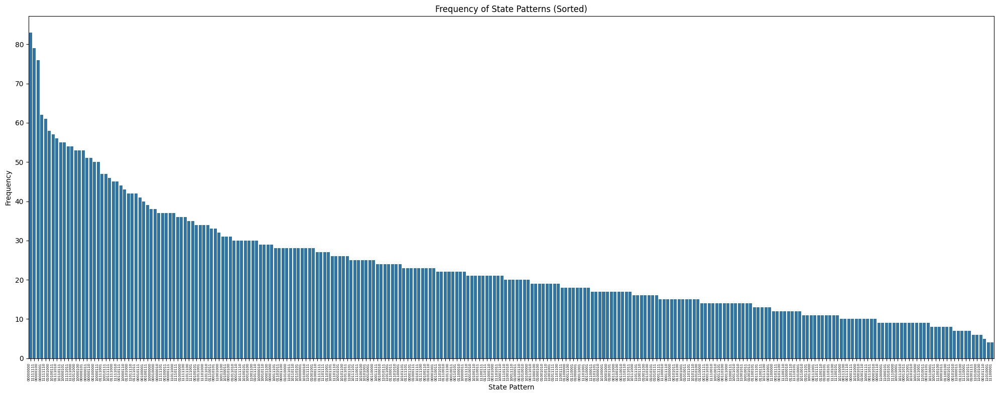

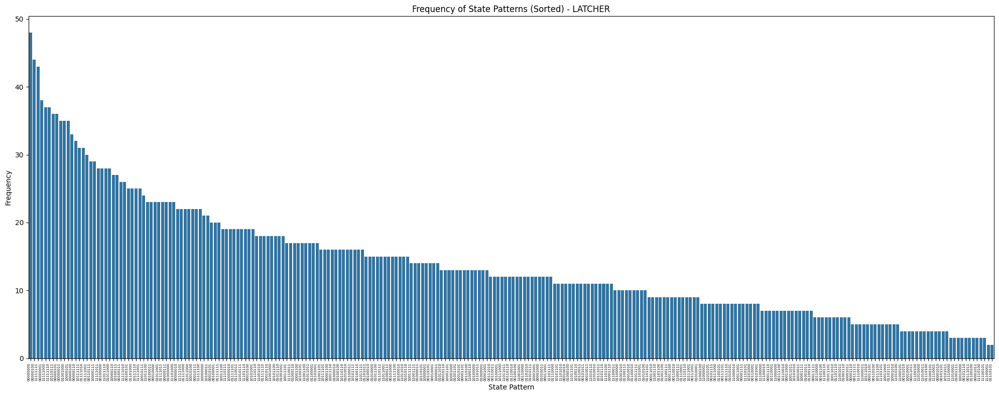

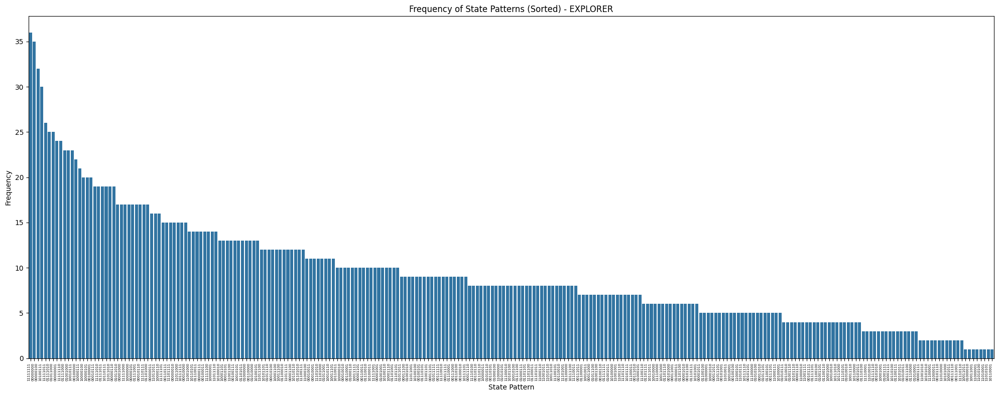

In [513]:
import matplotlib.pyplot as plt
import seaborn as sns

# Sort the pattern frequency by the frequency values in descending order
sorted_patterns = sorted(pattern_frequency.items(), key=lambda x: x[1], reverse=True)

# Extract the sorted patterns and frequencies
pattern_str_sorted = [''.join(map(str, key)) for key, value in sorted_patterns]
frequencies_sorted = [value for key, value in sorted_patterns]



plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str_sorted, y=frequencies_sorted)


plt.xticks(rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns (Sorted)')

plt.tight_layout()
plt.show()




























sorted_patterns_LATCHER = sorted(pattern_frequency_LATCHER.items(), key=lambda x: x[1], reverse=True)

# Extract the sorted patterns and frequencies
pattern_str_sorted_LATCHER = [''.join(map(str, key)) for key, value in sorted_patterns_LATCHER]
frequencies_sorted_LATCHER = [value for key, value in sorted_patterns_LATCHER]



plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str_sorted_LATCHER, y=frequencies_sorted_LATCHER)


plt.xticks(rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns (Sorted) - LATCHER')

plt.tight_layout()
plt.show()






























sorted_patterns_EXPLORER = sorted(pattern_frequency_EXPLORER.items(), key=lambda x: x[1], reverse=True)

# Extract the sorted patterns and frequencies
pattern_str_sorted_EXPLORER = [''.join(map(str, key)) for key, value in sorted_patterns_EXPLORER]
frequencies_sorted_EXPLORER = [value for key, value in sorted_patterns_EXPLORER]



plt.figure(figsize=(20, 8))
sns.barplot(x=pattern_str_sorted_EXPLORER, y=frequencies_sorted_EXPLORER)


plt.xticks(rotation=90, ha='right', fontsize=5)
plt.xlabel('State Pattern')
plt.ylabel('Frequency')
plt.title('Frequency of State Patterns (Sorted) - EXPLORER')

plt.tight_layout()
plt.show()




## Generating Patterns and their energy

### Fateme version's energy computation

In [514]:


def generate_combinations(N, h_vec, J_mat):





    sigma = [0,1]
    V = np.array(list(itertools.product(sigma, repeat = ROI)))

    E = np.zeros(2**ROI)

    # H_rand, J_rand = HandJ(data_p, ROI, l_t)
    E = -1 * np.dot(h_vec, V.T) - 0.5 * np.diag(np.dot(np.dot(V,J_mat), V.T))


    P = np.exp(-E)/np.sum(np.exp(-E))



    n = N #len(vector)
    combinations = []#,np.zeros(2**N)#[]
    for i in range(2**N):


        combinations.append([list(V[i,:]), E[i]])

    return combinations



In [515]:

N = ROI
patterns = generate_combinations(N,h_vec, J_mat)
# patterns[1][0]
patterns

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 0.3215279044787732],
 [[0, 0, 0, 0, 0, 0, 1, 0], 0.7043193153941414],
 [[0, 0, 0, 0, 0, 0, 1, 1], 0.7805105110723035],
 [[0, 0, 0, 0, 0, 1, 0, 0], 0.20683820425124694],
 [[0, 0, 0, 0, 0, 1, 0, 1], 0.3241632797375722],
 [[0, 0, 0, 0, 0, 1, 1, 0], 0.6573588347131617],
 [[0, 0, 0, 0, 0, 1, 1, 1], 0.5293472013988758],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.9020623429776031],
 [[0, 0, 0, 0, 1, 0, 0, 1], 1.385428093378183],
 [[0, 0, 0, 0, 1, 0, 1, 0], 2.042378520344247],
 [[0, 0, 0, 0, 1, 0, 1, 1], 2.280407561944216],
 [[0, 0, 0, 0, 1, 1, 0, 0], 1.2833066824400157],
 [[0, 0, 0, 0, 1, 1, 0, 1], 1.5624696038481478],
 [[0, 0, 0, 0, 1, 1, 1, 0], 2.169824174874433],
 [[0, 0, 0, 0, 1, 1, 1, 1], 2.2036503874819537],
 [[0, 0, 0, 1, 0, 0, 0, 0], 1.0140313802483205],
 [[0, 0, 0, 1, 0, 0, 0, 1], 1.2589052883810365],
 [[0, 0, 0, 1, 0, 0, 1, 0], 1.2837593788699582],
 [[0, 0, 0, 1, 0, 0, 1, 1], 1.2832965782020629],
 [[0, 0, 0, 1, 0, 1, 0, 0], 0.9830147

### My energy computation ****

In [516]:
'''

def generate_combinations(N, h_vec, J_mat):
    n = N #len(vector)
    combinations = []#,np.zeros(2**N)#[]

    for i in range(2**n):
        combination = [0] * n
        for j in range(n):
            if i & (1 << j):
                combination[j] = 1

        combinations.append([combination, Hamiltonian(combination, h_vec, J_mat)])

    return combinations
'''


'\n\ndef generate_combinations(N, h_vec, J_mat):\n    n = N #len(vector)\n    combinations = []#,np.zeros(2**N)#[]\n\n    for i in range(2**n):\n        combination = [0] * n\n        for j in range(n):\n            if i & (1 << j):\n                combination[j] = 1\n\n        combinations.append([combination, Hamiltonian(combination, h_vec, J_mat)])\n\n    return combinations\n'

## P_MODEL vs P_DATA

In [517]:

N = ROI #NUMBER OF ROI
patterns = generate_combinations(N,h_vec, J_mat)
patterns



patterns_LATCHER = generate_combinations(N,H_latcher, J_latcher)
# patterns





patterns_EXPLORER = generate_combinations(N,H_explorers, J_explorers)
# patterns








In [518]:
patterns_LATCHER

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 0.18889137012850568],
 [[0, 0, 0, 0, 0, 0, 1, 0], 0.6693375688625415],
 [[0, 0, 0, 0, 0, 0, 1, 1], 0.6654358525656641],
 [[0, 0, 0, 0, 0, 1, 0, 0], 0.20211443495628584],
 [[0, 0, 0, 0, 0, 1, 0, 1], 0.27932806299762203],
 [[0, 0, 0, 0, 0, 1, 1, 0], 0.5321819682372443],
 [[0, 0, 0, 0, 0, 1, 1, 1], 0.41660250985319747],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.9577593924343969],
 [[0, 0, 0, 0, 1, 0, 0, 1], 1.32783828280641],
 [[0, 0, 0, 0, 1, 0, 1, 0], 2.1578453545613727],
 [[0, 0, 0, 0, 1, 0, 1, 1], 2.335131158508003],
 [[0, 0, 0, 0, 1, 1, 0, 0], 1.3185143720752739],
 [[0, 0, 0, 0, 1, 1, 0, 1], 1.5769155203601173],
 [[0, 0, 0, 0, 1, 1, 1, 0], 2.179330298620666],
 [[0, 0, 0, 0, 1, 1, 1, 1], 2.244938360480127],
 [[0, 0, 0, 1, 0, 0, 0, 0], 1.147077050908923],
 [[0, 0, 0, 1, 0, 0, 0, 1], 1.260863454876884],
 [[0, 0, 0, 1, 0, 0, 1, 0], 1.4262310994543514],
 [[0, 0, 0, 1, 0, 0, 1, 1], 1.3472244169969296],
 [[0, 0, 0, 1, 0, 1, 0, 0], 1.0246117

In [519]:
patterns_EXPLORER

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 0.5269628050757985],
 [[0, 0, 0, 0, 0, 0, 1, 0], 0.7665255100769096],
 [[0, 0, 0, 0, 0, 0, 1, 1], 0.9651652873378902],
 [[0, 0, 0, 0, 0, 1, 0, 0], 0.20512373539541925],
 [[0, 0, 0, 0, 0, 1, 0, 1], 0.38573157517089174],
 [[0, 0, 0, 0, 0, 1, 1, 0], 0.8486152981411014],
 [[0, 0, 0, 0, 0, 1, 1, 1], 0.7009001101017559],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.83613297134154],
 [[0, 0, 0, 0, 1, 0, 0, 1], 1.4856427922053386],
 [[0, 0, 0, 0, 1, 0, 1, 0], 1.8964974935666326],
 [[0, 0, 0, 0, 1, 0, 1, 1], 2.2176842866156137],
 [[0, 0, 0, 0, 1, 1, 0, 0], 1.227962352153706],
 [[0, 0, 0, 0, 1, 1, 0, 1], 1.5311172077171789],
 [[0, 0, 0, 0, 1, 1, 1, 0], 2.165292927047571],
 [[0, 0, 0, 0, 1, 1, 1, 1], 2.1401247547962257],
 [[0, 0, 0, 1, 0, 0, 0, 0], 0.8347668670708361],
 [[0, 0, 0, 1, 0, 0, 0, 1], 1.2713140559170992],
 [[0, 0, 0, 1, 0, 0, 1, 0], 1.1056418271535988],
 [[0, 0, 0, 1, 0, 0, 1, 1], 1.2138659881850442],
 [[0, 0, 0, 1, 0, 1, 0, 0], 0.924870

In [520]:
# thiiiis

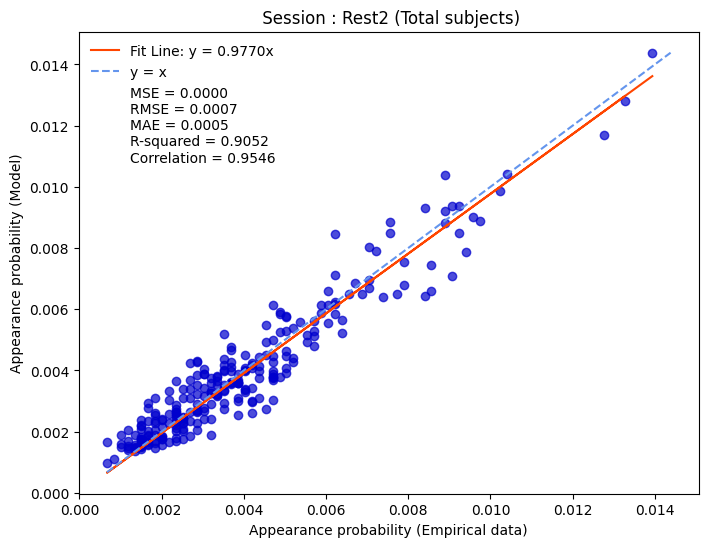

Raw MSE: 4.788350847530203e-07, Raw RMSE: 0.0006919791071651082


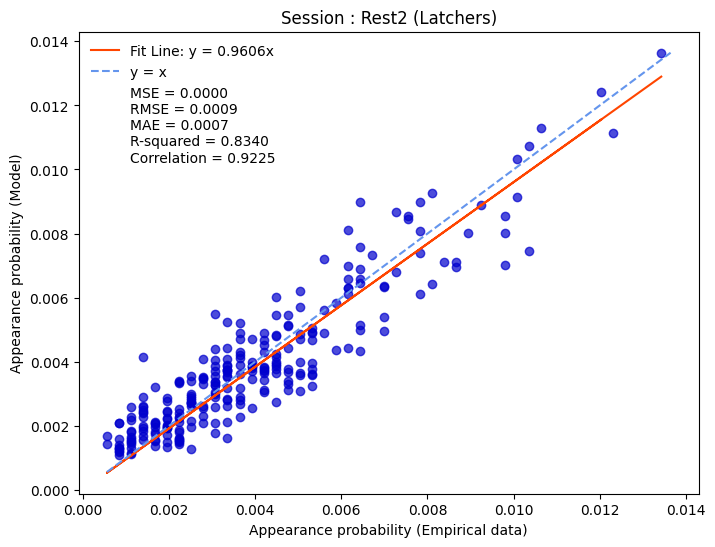

Raw MSE: 8.350376271744559e-07, Raw RMSE: 0.0009138039325667492


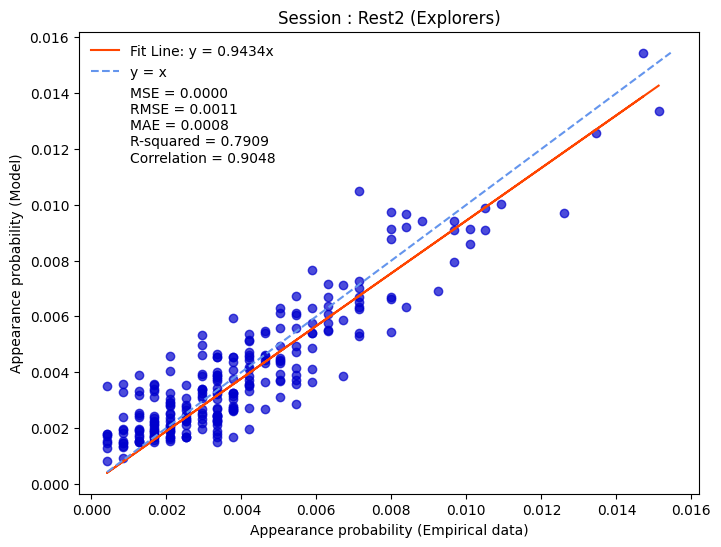

Raw MSE: 1.149049296345316e-06, Raw RMSE: 0.001071937169961615


In [521]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import nnls
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from scipy.stats import pearsonr

def data_probability(patterns):
    E = []
    P = []
    for m in patterns:
        P.append(m[0])
        E.append(m[1])

    E = np.array(E)
    total_E = np.exp(-E).sum()

    P_MODEL = {}
    for p, e in zip(P, E):
        P_MODEL[tuple(p)] = np.exp(-e) / total_E

    return P_MODEL

def plot_comparison(P_MODEL, P_DATA, title):
    # Create DataFrames for merging
    Pdf_model = pd.DataFrame(list(P_MODEL.items()), columns=['Pattern', 'P_MODEL'])
    Pdf_data = pd.DataFrame(list(P_DATA.items()), columns=['Pattern', 'P_DATA'])

    # Merge DataFrames on 'Pattern'
    Pmerged_df = pd.merge(Pdf_model, Pdf_data, on='Pattern', how='inner')

    # Fit a line using nnls
    m, _ = nnls(Pmerged_df['P_DATA'].values.reshape(-1, 1), Pmerged_df['P_MODEL'].values)

    # Calculate error metrics
    mse = mean_squared_error(Pmerged_df['P_MODEL'], m * Pmerged_df['P_DATA'])
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(Pmerged_df['P_MODEL'], m * Pmerged_df['P_DATA'])
    r2 = r2_score(Pmerged_df['P_MODEL'], m * Pmerged_df['P_DATA'])
    correlation, _ = pearsonr(Pmerged_df['P_DATA'], Pmerged_df['P_MODEL'])

    # Prepare the metrics text
    metrics_text = (
        f'MSE = {mse:.4f}\n'
        f'RMSE = {rmse:.4f}\n'
        f'MAE = {mae:.4f}\n'
        f'R-squared = {r2:.4f}\n'
        f'Correlation = {correlation:.4f}'
    )

    # Create the plot
    plt.figure(figsize=(8, 6))
    # Plot the fit line
    plt.plot(Pmerged_df['P_DATA'], m * Pmerged_df['P_DATA'], color='orangered', label=f'Fit Line: y = {m[0]:.4f}x')
    # Plot the scatter points
    plt.scatter(Pmerged_df['P_DATA'], Pmerged_df['P_MODEL'], color='mediumblue', alpha=0.7, ) #, label='Probability Point')

    # Plot the diagonal line y = x for reference
    x_vals = np.linspace(min(Pmerged_df['P_MODEL'].min(), Pmerged_df['P_DATA'].min()),
                         max(Pmerged_df['P_MODEL'].max(), Pmerged_df['P_DATA'].max()), 100)
    plt.plot(x_vals, x_vals, color='cornflowerblue', linestyle='--', label='y = x')

    # Create a dummy legend entry for the metrics text
    metrics_legend = plt.Line2D([0], [0], color='white', label=metrics_text)

    # Combine the legend entries: plot elements and metrics in one call
    handles, labels = plt.gca().get_legend_handles_labels()  # Get existing handles and labels
    handles.append(metrics_legend)  # Add the custom metrics legend
    labels.append(metrics_text)  # Add the custom metrics text

    plt.legend(handles=handles, labels=labels, loc='upper left', frameon=False)  # Add all to the same legend box

    # Labeling and Title
    plt.ylabel('Appearance probability (Model)')
    plt.xlabel('Appearance probability (Empirical data)')
    plt.title(title)
    plt.show()
    print(f'Raw MSE: {mse}, Raw RMSE: {rmse}')


# Calculate P_MODEL for each dataset
P_MODEL = data_probability(patterns)
P_MODEL_LATCHER = data_probability(patterns_LATCHER)
P_MODEL_EXPLORER = data_probability(patterns_EXPLORER)

# Generate the plots with metrics for each dataset
plot_comparison(P_MODEL, P_DATA, ' Session : {} (Total subjects)'.format(RUN_number))
plot_comparison(P_MODEL_LATCHER, P_DATA_LATCHER, 'Session : {} (Latchers)'.format(RUN_number))
plot_comparison(P_MODEL_EXPLORER, P_DATA_EXPLORER, 'Session : {} (Explorers)'.format(RUN_number))


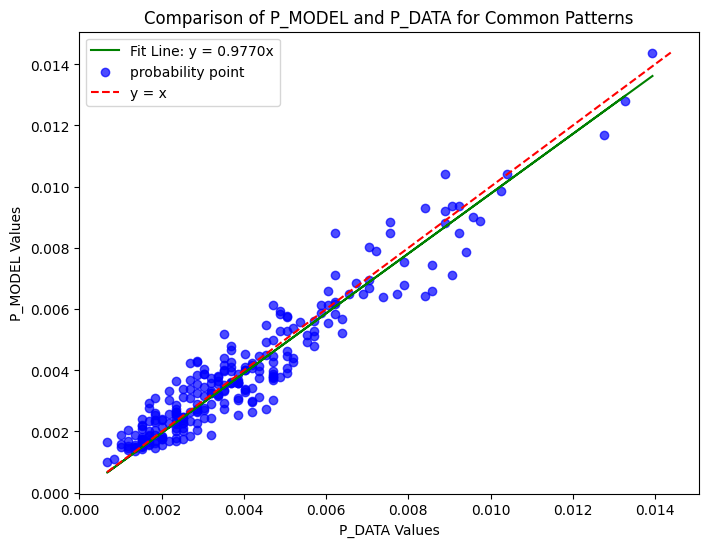

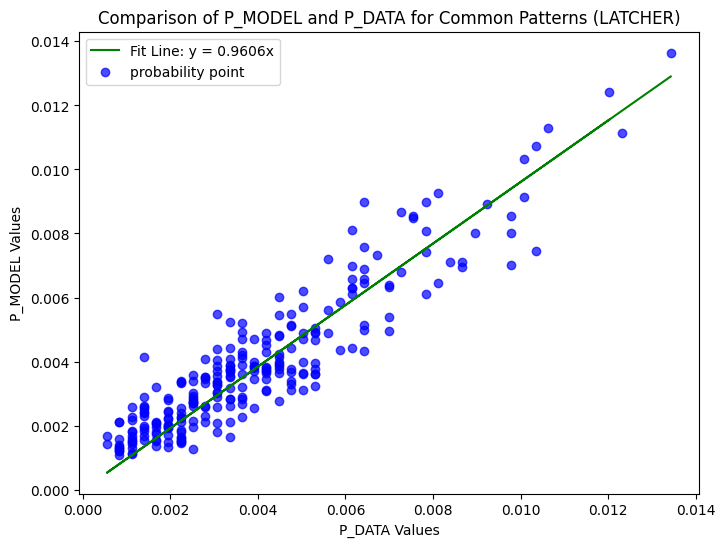

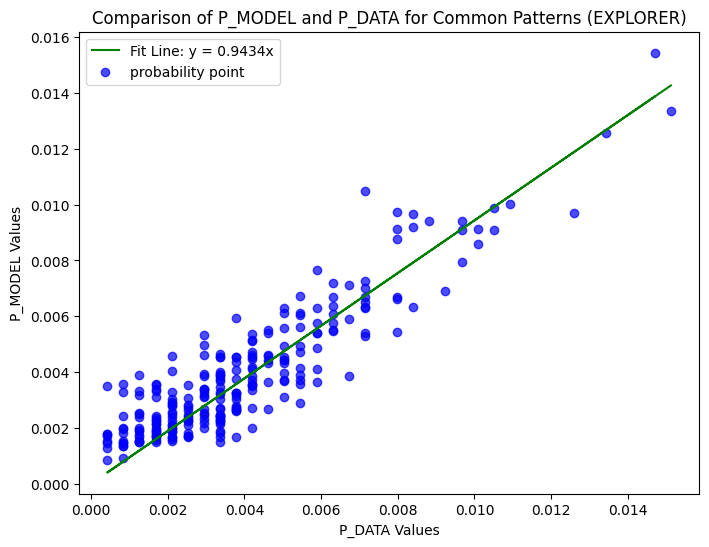

In [522]:

def data_probability(patterns):

        E = []
        P = []
        for m in patterns:
          # print(p,e)

          P.append(m[0])
          E.append(m[1])
          # print(p,e)
        # p


        E = np.array(E)
        total_E = (np.exp(-E)).sum()
        total_E



        # .sum()



        P_MODEL = {}


        for p,e in zip(P,E):

          P_MODEL[tuple(p)] = (np.exp(-e)) / total_E

        return(P_MODEL)





P_MODEL = data_probability(patterns)


P_MODEL_LATCHER = data_probability(patterns_LATCHER)

P_MODEL_EXPLORER = data_probability(patterns_EXPLORER)































Pdf_model = pd.DataFrame(list(P_MODEL.items()), columns=['Pattern', 'P_MODEL'])
Pdf_data = pd.DataFrame(list(P_DATA.items()), columns=['Pattern', 'P_DATA'])

# Step 2: Perform inner join on 'Pattern'
Pmerged_df = pd.merge(Pdf_model, Pdf_data, on='Pattern', how='inner')


### fitting the best line to the p and model and p of data:
from scipy.optimize import minimize, nnls

m, _ = nnls(Pmerged_df['P_DATA'].values.reshape(-1,1), Pmerged_df['P_MODEL'].values)



plt.figure(figsize=(8, 6))


plt.plot(Pmerged_df['P_DATA'], m * Pmerged_df['P_DATA'], color='green', label=f'Fit Line: y = {m[0]:.4f}x')



plt.scatter( Pmerged_df['P_DATA'],Pmerged_df['P_MODEL'], color='blue', alpha=0.7, label = 'probability point')




x_vals = np.linspace(min(Pmerged_df['P_MODEL'].min(), Pmerged_df['P_DATA'].min()),
                     max(Pmerged_df['P_MODEL'].max(), Pmerged_df['P_DATA'].max()), 100)
plt.plot(x_vals, x_vals, color='red', linestyle='--', label='y = x')

plt.ylabel('P_MODEL Values')
plt.xlabel('P_DATA Values')
plt.title('Comparison of P_MODEL and P_DATA for Common Patterns')
plt.legend()

plt.show()































Pdf_model_LATCHER = pd.DataFrame(list(P_MODEL_LATCHER.items()), columns=['Pattern', 'P_MODEL'])
Pdf_data_LATCHER = pd.DataFrame(list(P_DATA_LATCHER.items()), columns=['Pattern', 'P_DATA'])

# Step 2: Perform inner join on 'Pattern'
Pmerged_df_LATCHER = pd.merge(Pdf_model_LATCHER, Pdf_data_LATCHER, on='Pattern', how='inner')


### fitting the best line to the p and model and p of data:
from scipy.optimize import minimize, nnls

m2, _ = nnls(Pmerged_df_LATCHER['P_DATA'].values.reshape(-1,1), Pmerged_df_LATCHER['P_MODEL'].values)



plt.figure(figsize=(8, 6))


plt.plot(Pmerged_df_LATCHER['P_DATA'], m2 * Pmerged_df_LATCHER['P_DATA'], color='green', label=f'Fit Line: y = {m2[0]:.4f}x')



plt.scatter( Pmerged_df_LATCHER['P_DATA'],Pmerged_df_LATCHER['P_MODEL'], color='blue', alpha=0.7, label = 'probability point')




x_vals = np.linspace(min(Pmerged_df_LATCHER['P_MODEL'].min(), Pmerged_df_LATCHER['P_DATA'].min()),
                     max(Pmerged_df_LATCHER['P_MODEL'].max(), Pmerged_df_LATCHER['P_DATA'].max()), 100)
# plt.plot(x_vals, x_vals, color='red', linestyle='--', label='y = x')

plt.ylabel('P_MODEL Values')
plt.xlabel('P_DATA Values')
plt.title('Comparison of P_MODEL and P_DATA for Common Patterns (LATCHER)')
plt.legend()

plt.show()


































Pdf_model_EXPLORER = pd.DataFrame(list(P_MODEL_EXPLORER.items()), columns=['Pattern', 'P_MODEL'])
Pdf_data_EXPLORER = pd.DataFrame(list(P_DATA_EXPLORER.items()), columns=['Pattern', 'P_DATA'])

# Step 2: Perform inner join on 'Pattern'
Pmerged_df_EXPLORER = pd.merge(Pdf_model_EXPLORER, Pdf_data_EXPLORER, on='Pattern', how='inner')


### fitting the best line to the p and model and p of data:
from scipy.optimize import minimize, nnls

m3, _ = nnls(Pmerged_df_EXPLORER['P_DATA'].values.reshape(-1,1), Pmerged_df_EXPLORER['P_MODEL'].values)



plt.figure(figsize=(8, 6))


plt.plot(Pmerged_df_EXPLORER['P_DATA'], m3 * Pmerged_df_EXPLORER['P_DATA'], color='green', label=f'Fit Line: y = {m3[0]:.4f}x')



plt.scatter( Pmerged_df_EXPLORER['P_DATA'],Pmerged_df_EXPLORER['P_MODEL'], color='blue', alpha=0.7, label = 'probability point')




x_vals = np.linspace(min(Pmerged_df_EXPLORER['P_MODEL'].min(), Pmerged_df_EXPLORER['P_DATA'].min()),
                     max(Pmerged_df_EXPLORER['P_MODEL'].max(), Pmerged_df_EXPLORER['P_DATA'].max()), 100)
# plt.plot(x_vals, x_vals, color='red', linestyle='--', label='y = x')

plt.ylabel('P_MODEL Values')
plt.xlabel('P_DATA Values')
plt.title('Comparison of P_MODEL and P_DATA for Common Patterns (EXPLORER)')
plt.legend()
plt.show()

In [523]:
Pmerged_df['P_MODEL'].values.reshape(-1,1).shape


(256, 1)

In [524]:

Pdf_data['P_DATA'].sum()

1.0

In [525]:

Pdf_model['P_MODEL'].sum()

0.9999999999999999

In [526]:
from scipy.stats import pearsonr
R, _ = pearsonr(Pmerged_df['P_DATA'], Pmerged_df['P_MODEL'])
print(R)

0.9545861654746753


In [527]:
from scipy.stats import pearsonr
R_LATCHER, _ = pearsonr(Pmerged_df_LATCHER['P_DATA'], Pmerged_df_LATCHER['P_MODEL'])
print(R_LATCHER)

0.9225145638130738


In [528]:
from scipy.stats import pearsonr
R_EXPLORER, _ = pearsonr(Pmerged_df_EXPLORER['P_DATA'], Pmerged_df_EXPLORER['P_MODEL'])
print(R_EXPLORER)

0.9048145180896652


In [529]:



N = ROI #NUMBER OF ROI
patterns = generate_combinations(N,h_vec, J_mat)
patterns




edges = []

for i in range(len(patterns)):
  for j in range(len(patterns)):
    if i <= j:
      differences = np.abs(np.array(patterns[i][0]) - np.array(patterns[j][0]))
      sum = differences.sum()
      if sum == 1: # if the difference of patterns is binary, then they are neighbors
        edges.append((i+1,j+1))
        print(i+1,j+1, patterns[i][0], patterns[j][0])


edges


















edges_LATCHER = []

for i in range(len(patterns_LATCHER)):
  for j in range(len(patterns_LATCHER)):
    if i <= j:
      differences = np.abs(np.array(patterns_LATCHER[i][0]) - np.array(patterns_LATCHER[j][0]))
      sum = differences.sum()
      if sum == 1: # if the difference of patterns is binary, then they are neighbors
        edges_LATCHER.append((i+1,j+1))
        # print(i+1,j+1, patterns_LATCHER[i][0], patterns_LATCHER[j][0])


edges_LATCHER








edges_EXPLORER = []

for i in range(len(patterns_EXPLORER)):
  for j in range(len(patterns_EXPLORER)):
    if i <= j:
      differences = np.abs(np.array(patterns_EXPLORER[i][0]) - np.array(patterns_EXPLORER[j][0]))
      sum = differences.sum()
      if sum == 1: # if the difference of patterns is binary, then they are neighbors
        edges_EXPLORER.append((i+1,j+1))
        # print(i+1,j+1, patterns[i][0], patterns[j][0])


edges_EXPLORER

1 2 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 0, 0, 0, 0, 0, 1]
1 3 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 0, 0, 0, 0, 1, 0]
1 5 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 0, 0, 0, 1, 0, 0]
1 9 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 0, 0, 1, 0, 0, 0]
1 17 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 0, 1, 0, 0, 0, 0]
1 33 [0, 0, 0, 0, 0, 0, 0, 0] [0, 0, 1, 0, 0, 0, 0, 0]
1 65 [0, 0, 0, 0, 0, 0, 0, 0] [0, 1, 0, 0, 0, 0, 0, 0]
1 129 [0, 0, 0, 0, 0, 0, 0, 0] [1, 0, 0, 0, 0, 0, 0, 0]
2 4 [0, 0, 0, 0, 0, 0, 0, 1] [0, 0, 0, 0, 0, 0, 1, 1]
2 6 [0, 0, 0, 0, 0, 0, 0, 1] [0, 0, 0, 0, 0, 1, 0, 1]
2 10 [0, 0, 0, 0, 0, 0, 0, 1] [0, 0, 0, 0, 1, 0, 0, 1]
2 18 [0, 0, 0, 0, 0, 0, 0, 1] [0, 0, 0, 1, 0, 0, 0, 1]
2 34 [0, 0, 0, 0, 0, 0, 0, 1] [0, 0, 1, 0, 0, 0, 0, 1]
2 66 [0, 0, 0, 0, 0, 0, 0, 1] [0, 1, 0, 0, 0, 0, 0, 1]
2 130 [0, 0, 0, 0, 0, 0, 0, 1] [1, 0, 0, 0, 0, 0, 0, 1]
3 4 [0, 0, 0, 0, 0, 0, 1, 0] [0, 0, 0, 0, 0, 0, 1, 1]
3 7 [0, 0, 0, 0, 0, 0, 1, 0] [0, 0, 0, 0, 0, 1, 1, 0]
3 11 [0, 0, 0, 0, 0, 0, 1, 0] [0, 0, 0, 0, 1, 0, 1, 0]
3 19 [0, 0, 0, 0

[(1, 2),
 (1, 3),
 (1, 5),
 (1, 9),
 (1, 17),
 (1, 33),
 (1, 65),
 (1, 129),
 (2, 4),
 (2, 6),
 (2, 10),
 (2, 18),
 (2, 34),
 (2, 66),
 (2, 130),
 (3, 4),
 (3, 7),
 (3, 11),
 (3, 19),
 (3, 35),
 (3, 67),
 (3, 131),
 (4, 8),
 (4, 12),
 (4, 20),
 (4, 36),
 (4, 68),
 (4, 132),
 (5, 6),
 (5, 7),
 (5, 13),
 (5, 21),
 (5, 37),
 (5, 69),
 (5, 133),
 (6, 8),
 (6, 14),
 (6, 22),
 (6, 38),
 (6, 70),
 (6, 134),
 (7, 8),
 (7, 15),
 (7, 23),
 (7, 39),
 (7, 71),
 (7, 135),
 (8, 16),
 (8, 24),
 (8, 40),
 (8, 72),
 (8, 136),
 (9, 10),
 (9, 11),
 (9, 13),
 (9, 25),
 (9, 41),
 (9, 73),
 (9, 137),
 (10, 12),
 (10, 14),
 (10, 26),
 (10, 42),
 (10, 74),
 (10, 138),
 (11, 12),
 (11, 15),
 (11, 27),
 (11, 43),
 (11, 75),
 (11, 139),
 (12, 16),
 (12, 28),
 (12, 44),
 (12, 76),
 (12, 140),
 (13, 14),
 (13, 15),
 (13, 29),
 (13, 45),
 (13, 77),
 (13, 141),
 (14, 16),
 (14, 30),
 (14, 46),
 (14, 78),
 (14, 142),
 (15, 16),
 (15, 31),
 (15, 47),
 (15, 79),
 (15, 143),
 (16, 32),
 (16, 48),
 (16, 80),
 (16, 144),


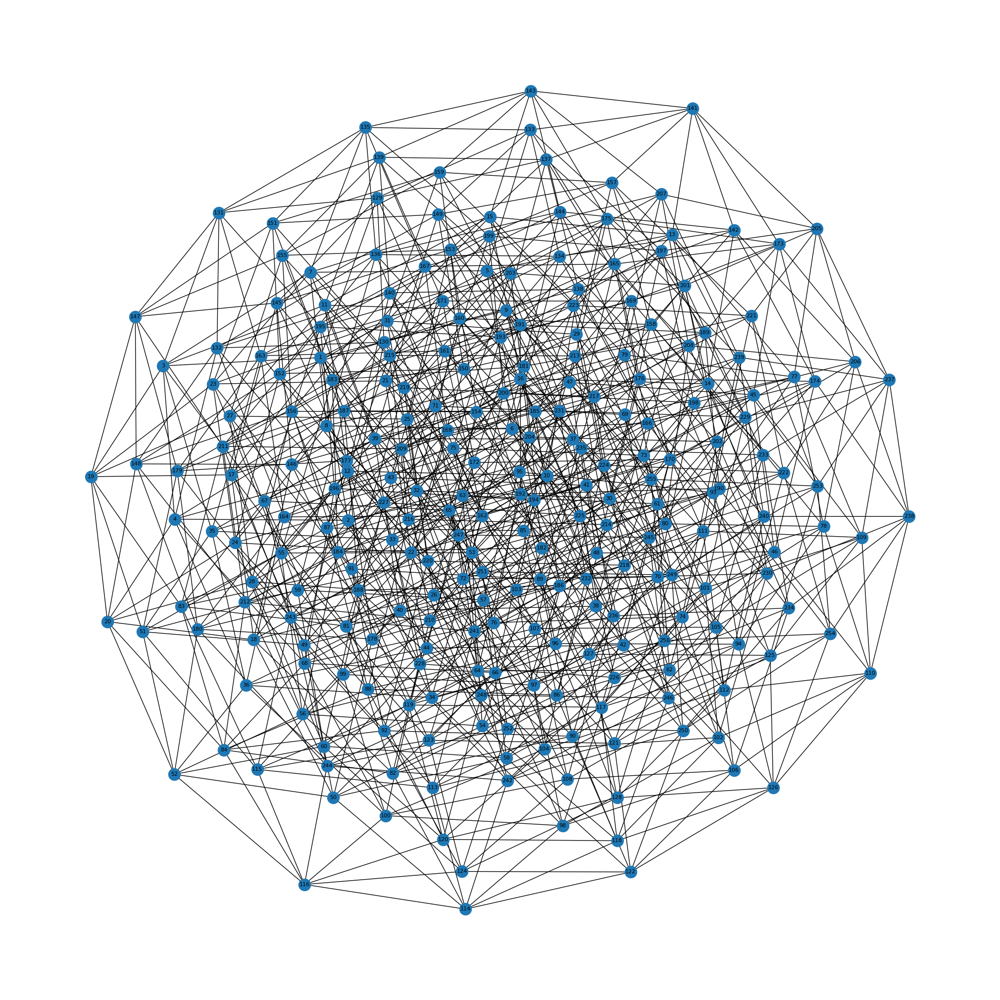

In [530]:

# creating the graph of the patterns :
edges = []

for i in range(len(patterns)):
  for j in range(len(patterns)):
    if i <= j:
      differences = np.abs(np.array(patterns[i][0]) - np.array(patterns[j][0]))
      sum = differences.sum()
      if sum == 1:
        edges.append((i+1,j+1))





G = nx.Graph()

G.add_edges_from(edges)

# nx.draw(G, with_labels=True)
# plt.show()



# pos=nx.spring_layout(G) #default to scale=1

# nx.draw(G,pos)
# pos=nx.spring_layout(G,scale=.5) # double distance between all nodes

# nx.draw(G,pos, with_labels=True)


pos=nx.spring_layout(G)
plt.figure(1,figsize=(20,20))

nx.draw(G,pos,font_size=8, with_labels=True)

#nx.draw(G,pos,font_size=10)











Text(0.5, 1.0, 'LATCHER')

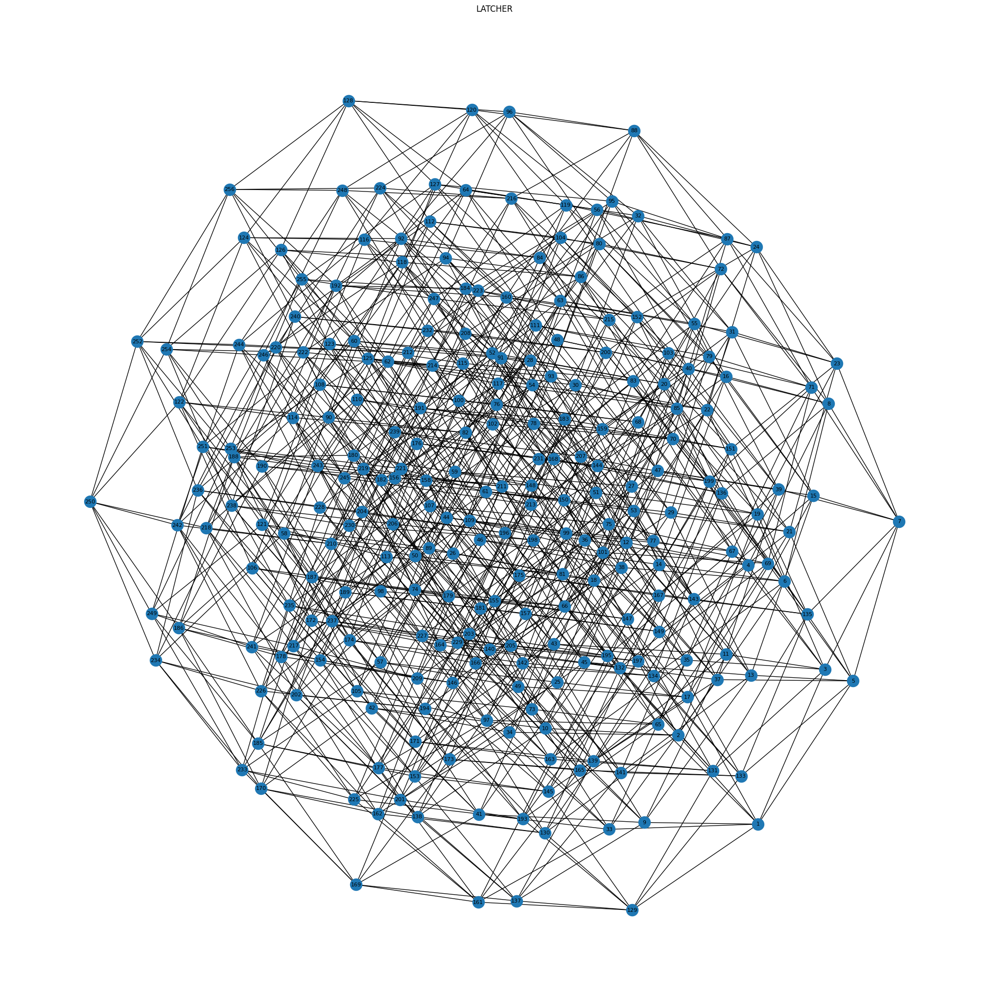

In [531]:


G_LATCHER = nx.Graph()

G_LATCHER.add_edges_from(edges_LATCHER)


pos=nx.spring_layout(G_LATCHER)
plt.figure(1,figsize=(20,20))
nx.draw(G_LATCHER,pos,font_size=8, with_labels=True)
plt.title('LATCHER')



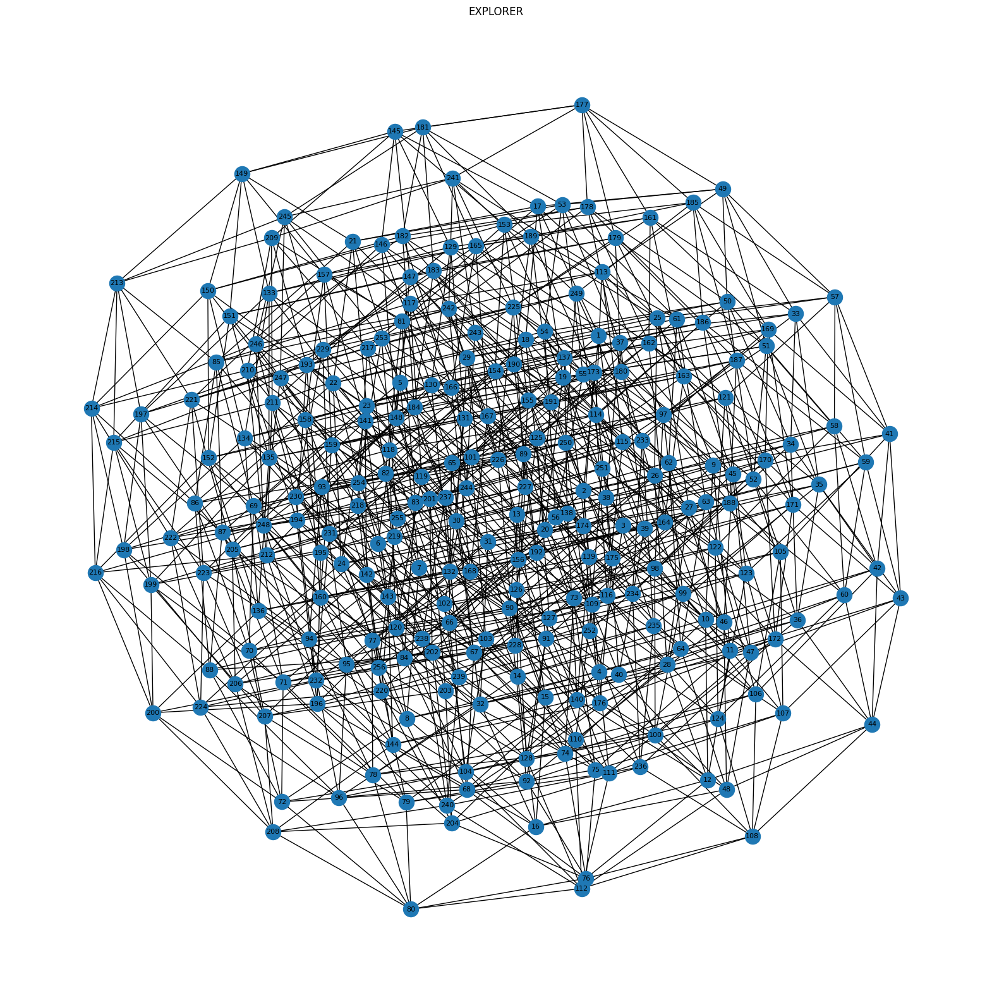

In [532]:

G_EXPLORER = nx.Graph()
G_EXPLORER.add_edges_from(edges_EXPLORER)
pos=nx.spring_layout(G_EXPLORER)
plt.figure(1,figsize=(20,20))
plt.title('EXPLORER')
nx.draw(G_EXPLORER,pos,font_size=8, with_labels=True)

In [533]:
# Defining a dictionary called NODES that record the number of node, its patterns and its energy simultaneously:

NODES = {}
for node , (i,j) in enumerate(patterns):
  # print(i,j,node+1)

  NODES[node+1] = [i,j]










NODES_LATCHER = {}
for node , (i,j) in enumerate(patterns_LATCHER):

  NODES_LATCHER[node+1] = [i,j]





NODES_EXPLORER = {}
for node , (i,j) in enumerate(patterns_EXPLORER):


  NODES_EXPLORER[node+1] = [i,j]

In [534]:
NODES

NODES_EXPLORER


NODES_LATCHER

{1: [[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 2: [[0, 0, 0, 0, 0, 0, 0, 1], 0.18889137012850568],
 3: [[0, 0, 0, 0, 0, 0, 1, 0], 0.6693375688625415],
 4: [[0, 0, 0, 0, 0, 0, 1, 1], 0.6654358525656641],
 5: [[0, 0, 0, 0, 0, 1, 0, 0], 0.20211443495628584],
 6: [[0, 0, 0, 0, 0, 1, 0, 1], 0.27932806299762203],
 7: [[0, 0, 0, 0, 0, 1, 1, 0], 0.5321819682372443],
 8: [[0, 0, 0, 0, 0, 1, 1, 1], 0.41660250985319747],
 9: [[0, 0, 0, 0, 1, 0, 0, 0], 0.9577593924343969],
 10: [[0, 0, 0, 0, 1, 0, 0, 1], 1.32783828280641],
 11: [[0, 0, 0, 0, 1, 0, 1, 0], 2.1578453545613727],
 12: [[0, 0, 0, 0, 1, 0, 1, 1], 2.335131158508003],
 13: [[0, 0, 0, 0, 1, 1, 0, 0], 1.3185143720752739],
 14: [[0, 0, 0, 0, 1, 1, 0, 1], 1.5769155203601173],
 15: [[0, 0, 0, 0, 1, 1, 1, 0], 2.179330298620666],
 16: [[0, 0, 0, 0, 1, 1, 1, 1], 2.244938360480127],
 17: [[0, 0, 0, 1, 0, 0, 0, 0], 1.147077050908923],
 18: [[0, 0, 0, 1, 0, 0, 0, 1], 1.260863454876884],
 19: [[0, 0, 0, 1, 0, 0, 1, 0], 1.4262310994543514],
 20: [[0, 0, 0, 1, 

In [535]:
 [[0, 1, 1, 1, 0, 0, 0, 0], 0.8129992993728519],


([[0, 1, 1, 1, 0, 0, 0, 0], 0.8129992993728519],)

In [536]:
G

#### Energy VS Frequency

In [537]:
patterns

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 0.3215279044787732],
 [[0, 0, 0, 0, 0, 0, 1, 0], 0.7043193153941414],
 [[0, 0, 0, 0, 0, 0, 1, 1], 0.7805105110723035],
 [[0, 0, 0, 0, 0, 1, 0, 0], 0.20683820425124694],
 [[0, 0, 0, 0, 0, 1, 0, 1], 0.3241632797375722],
 [[0, 0, 0, 0, 0, 1, 1, 0], 0.6573588347131617],
 [[0, 0, 0, 0, 0, 1, 1, 1], 0.5293472013988758],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.9020623429776031],
 [[0, 0, 0, 0, 1, 0, 0, 1], 1.385428093378183],
 [[0, 0, 0, 0, 1, 0, 1, 0], 2.042378520344247],
 [[0, 0, 0, 0, 1, 0, 1, 1], 2.280407561944216],
 [[0, 0, 0, 0, 1, 1, 0, 0], 1.2833066824400157],
 [[0, 0, 0, 0, 1, 1, 0, 1], 1.5624696038481478],
 [[0, 0, 0, 0, 1, 1, 1, 0], 2.169824174874433],
 [[0, 0, 0, 0, 1, 1, 1, 1], 2.2036503874819537],
 [[0, 0, 0, 1, 0, 0, 0, 0], 1.0140313802483205],
 [[0, 0, 0, 1, 0, 0, 0, 1], 1.2589052883810365],
 [[0, 0, 0, 1, 0, 0, 1, 0], 1.2837593788699582],
 [[0, 0, 0, 1, 0, 0, 1, 1], 1.2832965782020629],
 [[0, 0, 0, 1, 0, 1, 0, 0], 0.9830147

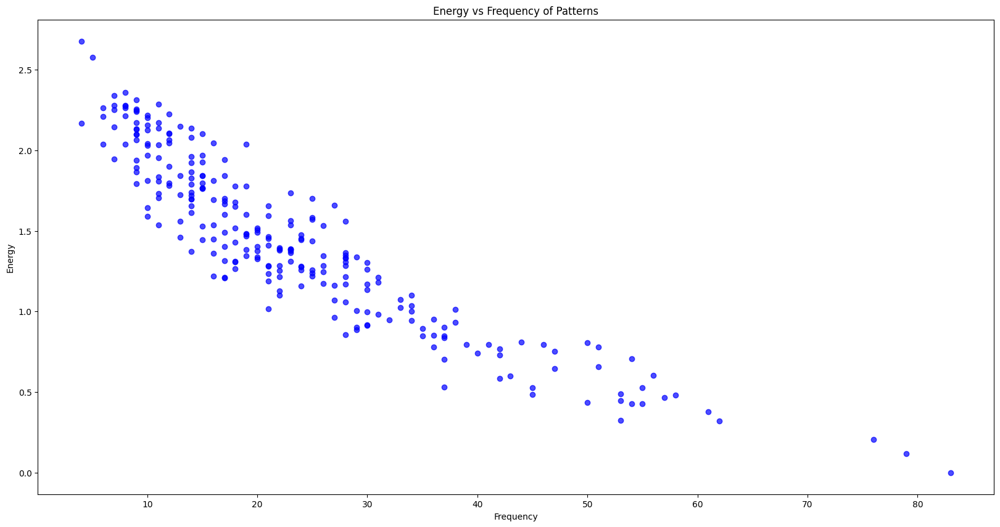

In [538]:


import numpy as np
import matplotlib.pyplot as plt
from collections import Counter



pattern_data = []

for pattern_list, energy in patterns:
    pattern_tuple = tuple(pattern_list)
    if pattern_tuple in pattern_frequency:
        frequency = pattern_frequency[pattern_tuple]
        pattern_data.append((pattern_tuple, frequency, energy))

frequencies = [item[1] for item in pattern_data]
energies = [item[2] for item in pattern_data]

plt.figure(figsize=(20, 10))

plt.scatter(frequencies, energies, color='blue', alpha=0.7)
plt.xlabel('Frequency')
plt.ylabel('Energy')
plt.title('Energy vs Frequency of Patterns')
# plt.grid(True)
plt.show()


In [539]:
# pd.DataFrame(pattern_data)
# list(pattern_data[0][0])

In [540]:
# pattern_data
pattern_frequency

Counter({(1, 1, 1, 0, 0, 0, 0, 0): 12,
         (1, 1, 0, 0, 1, 1, 0, 1): 25,
         (0, 0, 1, 1, 1, 0, 1, 0): 19,
         (0, 0, 0, 0, 0, 1, 0, 0): 76,
         (1, 0, 0, 1, 1, 1, 0, 0): 31,
         (1, 0, 0, 1, 1, 1, 1, 1): 24,
         (1, 0, 0, 1, 1, 1, 0, 1): 28,
         (1, 0, 1, 1, 1, 1, 1, 1): 46,
         (1, 0, 1, 1, 1, 1, 0, 1): 25,
         (1, 1, 1, 1, 0, 1, 1, 1): 36,
         (1, 0, 0, 0, 0, 0, 1, 0): 29,
         (1, 1, 1, 1, 1, 0, 1, 1): 54,
         (0, 0, 0, 0, 0, 0, 0, 0): 83,
         (1, 1, 0, 0, 0, 1, 0, 0): 19,
         (0, 0, 0, 0, 0, 0, 1, 0): 37,
         (0, 0, 0, 1, 1, 1, 1, 1): 15,
         (0, 0, 1, 0, 0, 1, 1, 1): 39,
         (0, 1, 1, 0, 1, 0, 1, 1): 28,
         (0, 1, 1, 1, 1, 0, 0, 1): 47,
         (0, 1, 1, 1, 0, 0, 0, 0): 14,
         (0, 1, 1, 1, 1, 0, 1, 0): 56,
         (1, 1, 1, 0, 0, 0, 1, 1): 17,
         (0, 0, 0, 0, 1, 1, 1, 0): 9,
         (0, 0, 0, 0, 1, 1, 0, 0): 28,
         (1, 0, 1, 0, 1, 1, 0, 1): 23,
         (1, 1, 1, 1, 0, 1

<ipython-input-541-663a43f13ab9>:37: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Frequency')


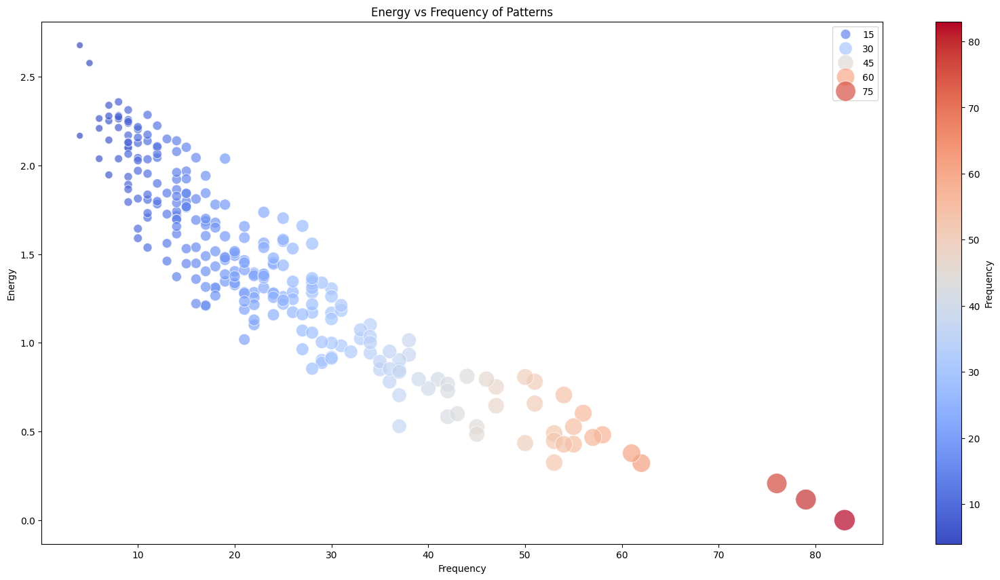

<ipython-input-541-663a43f13ab9>:104: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Frequency')


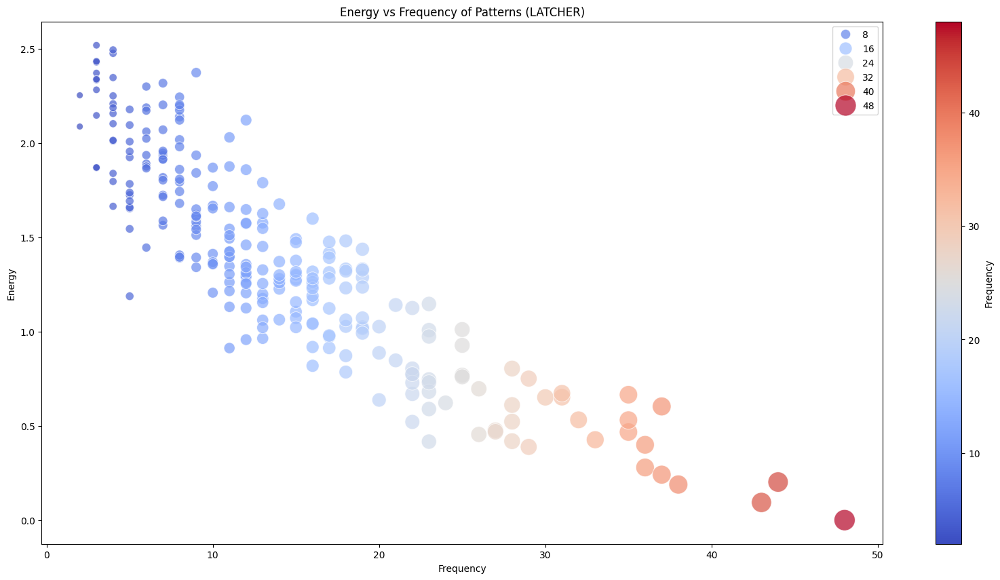

<ipython-input-541-663a43f13ab9>:168: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, label='Frequency')


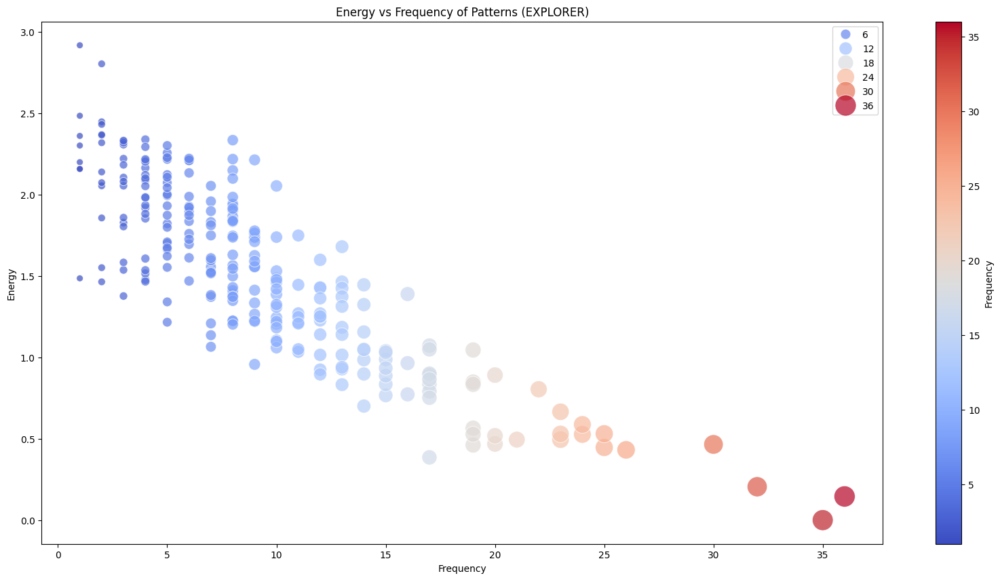

In [541]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

pattern_data = []

for pattern_list, energy in patterns:
    pattern_tuple = tuple(pattern_list)  # Convert list to tuple to use as dictionary key
    if pattern_tuple in pattern_frequency:
        frequency = pattern_frequency[pattern_tuple]
        pattern_data.append((pattern_tuple, frequency, energy))




frequencies = [item[1] for item in pattern_data]
energies = [item[2] for item in pattern_data]

plt.figure(figsize=(20, 10))
# plt.grid(True)

sns.scatterplot(
    x=frequencies, y=energies,
    size=frequencies, hue=frequencies,  # Size and color both based on frequency
    sizes=(50, 500), palette='coolwarm',  # Customize the size and color palette
    alpha=0.7
)

plt.xlabel('Frequency')
plt.ylabel('Energy')
plt.title('Energy vs Frequency of Patterns')

# Adding colorbar to represent frequency range
norm = plt.Normalize(np.min(frequencies), np.max(frequencies))
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Frequency')

plt.show()
































pattern_data_LATCHER = []

for pattern_list, energy in patterns_LATCHER:
    pattern_tuple = tuple(pattern_list)  # Convert list to tuple to use as dictionary key
    if pattern_tuple in pattern_frequency_LATCHER:
        frequency = pattern_frequency_LATCHER[pattern_tuple]
        pattern_data_LATCHER.append((pattern_tuple, frequency, energy))




frequencies_LATCHER = [item[1] for item in pattern_data_LATCHER]
energies_LATCHER = [item[2] for item in pattern_data_LATCHER]

plt.figure(figsize=(20, 10))
# plt.grid(True)

sns.scatterplot(
    x=frequencies_LATCHER, y=energies_LATCHER,
    size=frequencies_LATCHER, hue=frequencies_LATCHER,  # Size and color both based on frequency
    sizes=(50, 500), palette='coolwarm',  # Customize the size and color palette
    alpha=0.7
)

plt.xlabel('Frequency')
plt.ylabel('Energy')
plt.title('Energy vs Frequency of Patterns (LATCHER)')

# Adding colorbar to represent frequency range
norm = plt.Normalize(np.min(frequencies_LATCHER), np.max(frequencies_LATCHER))
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Frequency')

plt.show()





























pattern_data_EXPLORER = []

for pattern_list, energy in patterns_EXPLORER:
    pattern_tuple = tuple(pattern_list)  # Convert list to tuple to use as dictionary key
    if pattern_tuple in pattern_frequency_EXPLORER:
        frequency = pattern_frequency_EXPLORER[pattern_tuple]
        pattern_data_EXPLORER.append((pattern_tuple, frequency, energy))




frequencies_EXPLORER = [item[1] for item in pattern_data_EXPLORER]
energies_EXPLORER = [item[2] for item in pattern_data_EXPLORER]

plt.figure(figsize=(20, 10))
# plt.grid(True)

sns.scatterplot(
    x=frequencies_EXPLORER, y=energies_EXPLORER,
    size=frequencies_EXPLORER, hue=frequencies_EXPLORER,  # Size and color both based on frequency
    sizes=(50, 500), palette='coolwarm',  # Customize the size and color palette
    alpha=0.7
)

plt.xlabel('Frequency')
plt.ylabel('Energy')
plt.title('Energy vs Frequency of Patterns (EXPLORER)')

# Adding colorbar to represent frequency range
norm = plt.Normalize(np.min(frequencies_EXPLORER), np.max(frequencies_EXPLORER))
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
sm.set_array([])
plt.colorbar(sm, label='Frequency')

plt.show()


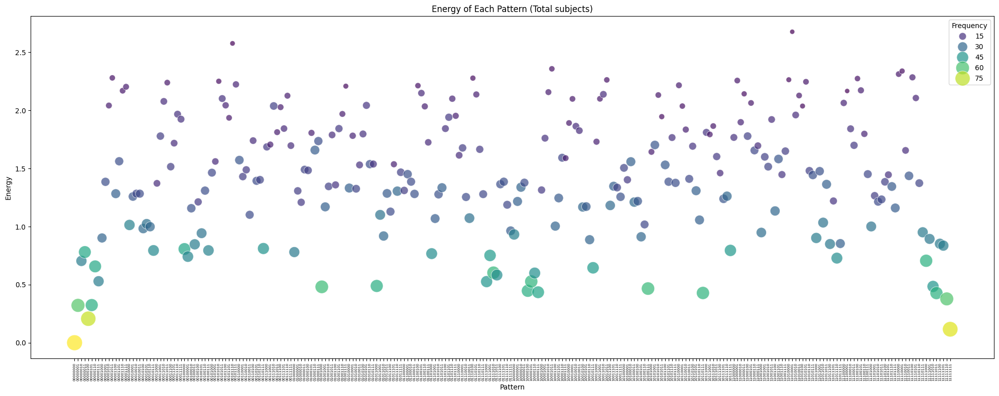

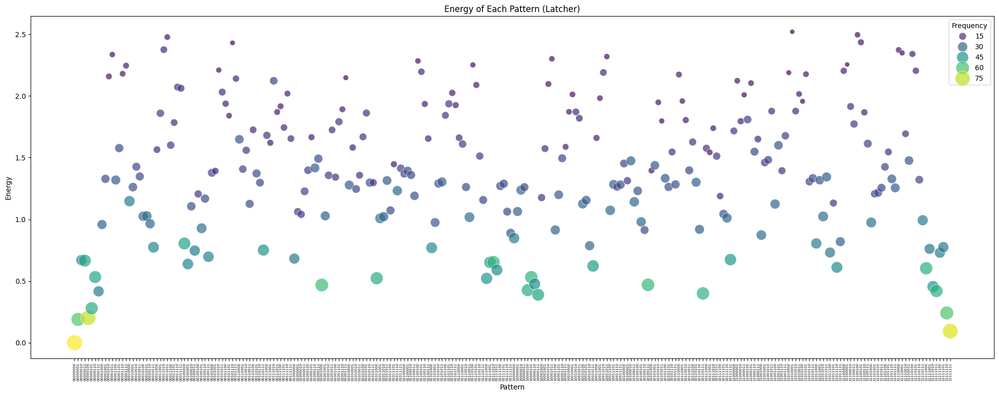

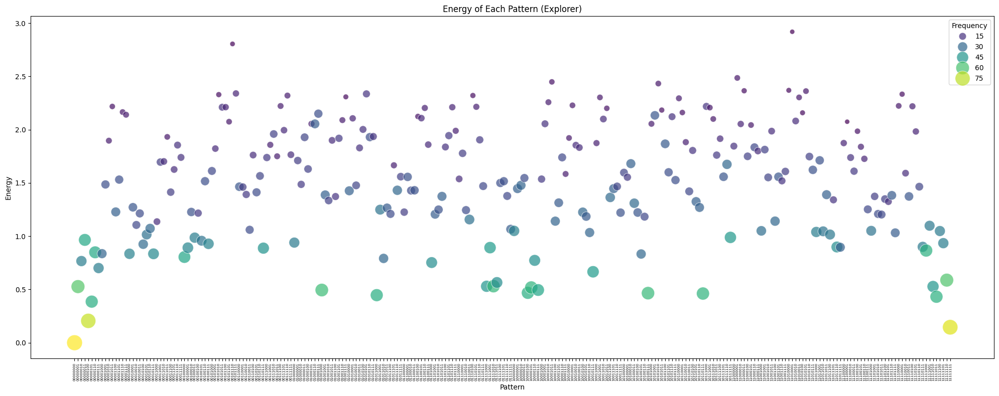

In [542]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Create a list of pattern strings for better readability in the plot
pattern_strings = [''.join(map(str, pattern[0])) for pattern in patterns]

# Extract the corresponding energies and frequencies from the original data
energies = [pattern[1] for pattern in patterns]
frequencies = [pattern_frequency.get(tuple(pattern[0]), 0) for pattern in patterns]  # Convert to tuple

# Create a DataFrame for plotting
data = pd.DataFrame({
    'Pattern': pattern_strings,
    'Energy': energies,
    'Frequency': frequencies
})

# Plot using seaborn scatterplot
plt.figure(figsize=(20, 8))
scatter = sns.scatterplot(
    x='Pattern', y='Energy', size='Frequency', hue='Frequency',
    sizes=(50, 500), palette='viridis', data=data, alpha=0.7
)





plt.xlabel('Pattern')
plt.ylabel('Energy')
plt.title('Energy of Each Pattern (Total subjects)')

plt.xticks(rotation=90, fontsize=5)
plt.tight_layout()
plt.show()



















































pattern_strings_LATCHER = [''.join(map(str, pattern[0])) for pattern in patterns_LATCHER]

# Extract the corresponding energies and frequencies from the original data
energies_LATCHER = [pattern[1] for pattern in patterns_LATCHER]
frequencies_LATCHER = [pattern_frequency.get(tuple(pattern[0]), 0) for pattern in patterns_LATCHER]  # Convert to tuple

# Create a DataFrame for plotting
data_LATCHER = pd.DataFrame({
    'Pattern': pattern_strings_LATCHER,
    'Energy': energies_LATCHER,
    'Frequency': frequencies_LATCHER
})

# Plot using seaborn scatterplot
plt.figure(figsize=(20, 8))
scatter = sns.scatterplot(
    x='Pattern', y='Energy', size='Frequency', hue='Frequency',
    sizes=(50, 500), palette='viridis', data=data_LATCHER, alpha=0.7)


plt.xlabel('Pattern')
plt.ylabel('Energy')
plt.title('Energy of Each Pattern (Latcher)')

plt.xticks(rotation=90, fontsize=5)
plt.tight_layout()
plt.show()






























pattern_strings_EXPLORER = [''.join(map(str, pattern[0])) for pattern in patterns_EXPLORER]

# Extract the corresponding energies and frequencies from the original data
energies_EXPLORER = [pattern[1] for pattern in patterns_EXPLORER]
frequencies_EXPLORER = [pattern_frequency.get(tuple(pattern[0]), 0) for pattern in patterns_EXPLORER]  # Convert to tuple

# Create a DataFrame for plotting
data_EXPLORER = pd.DataFrame({
    'Pattern': pattern_strings_EXPLORER,
    'Energy': energies_EXPLORER,
    'Frequency': frequencies_EXPLORER
})

# Plot using seaborn scatterplot
plt.figure(figsize=(20, 8))
scatter = sns.scatterplot(
    x='Pattern', y='Energy', size='Frequency', hue='Frequency',
    sizes=(50, 500), palette='viridis', data=data_EXPLORER, alpha=0.7
)





plt.xlabel('Pattern')
plt.ylabel('Energy')
plt.title('Energy of Each Pattern (Explorer)')

plt.xticks(rotation=90, fontsize=5)
plt.tight_layout()
plt.show()



Text(0, 0.5, 'frequency')

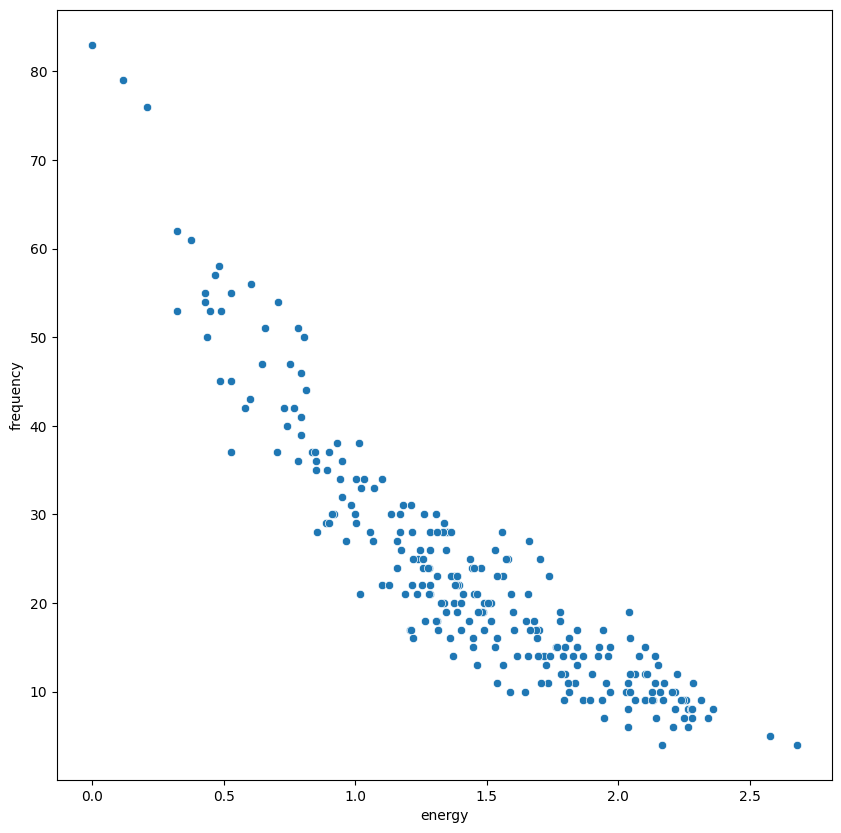

In [543]:

N = ROI #NUMBER OF ROI
patterns = generate_combinations(N,h_vec, J_mat)
patterns






ALL = {}

for k in pattern_frequency.keys():

    # print(k)
    for p in patterns:

        # print(p[0], list(k))

        if list(k) == p[0]:

            ALL[k] = [ pattern_frequency[k], p[1] ]
#     patterns
# pattern_counts


# ALL[(0, 0, 0, 0, 1, 0, 1)]

ALL









# pattern_counts

#8 networks and t0 threshold considered.







freq = []
energy = []

for k in ALL.keys():

    freq.append(ALL[k][0])
    energy.append(ALL[k][1])


len(energy)


plt.figure(figsize = (10,10))


sns.scatterplot( x = energy ,y  =freq)


plt.xlabel('energy')

plt.ylabel('frequency')






In [544]:
NODES

{1: [[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 2: [[0, 0, 0, 0, 0, 0, 0, 1], 0.3215279044787732],
 3: [[0, 0, 0, 0, 0, 0, 1, 0], 0.7043193153941414],
 4: [[0, 0, 0, 0, 0, 0, 1, 1], 0.7805105110723035],
 5: [[0, 0, 0, 0, 0, 1, 0, 0], 0.20683820425124694],
 6: [[0, 0, 0, 0, 0, 1, 0, 1], 0.3241632797375722],
 7: [[0, 0, 0, 0, 0, 1, 1, 0], 0.6573588347131617],
 8: [[0, 0, 0, 0, 0, 1, 1, 1], 0.5293472013988758],
 9: [[0, 0, 0, 0, 1, 0, 0, 0], 0.9020623429776031],
 10: [[0, 0, 0, 0, 1, 0, 0, 1], 1.385428093378183],
 11: [[0, 0, 0, 0, 1, 0, 1, 0], 2.042378520344247],
 12: [[0, 0, 0, 0, 1, 0, 1, 1], 2.280407561944216],
 13: [[0, 0, 0, 0, 1, 1, 0, 0], 1.2833066824400157],
 14: [[0, 0, 0, 0, 1, 1, 0, 1], 1.5624696038481478],
 15: [[0, 0, 0, 0, 1, 1, 1, 0], 2.169824174874433],
 16: [[0, 0, 0, 0, 1, 1, 1, 1], 2.2036503874819537],
 17: [[0, 0, 0, 1, 0, 0, 0, 0], 1.0140313802483205],
 18: [[0, 0, 0, 1, 0, 0, 0, 1], 1.2589052883810365],
 19: [[0, 0, 0, 1, 0, 0, 1, 0], 1.2837593788699582],
 20: [[0, 0, 0, 1, 

# Local Minima Identification

I am a local minimum. --  1 8 -0.0 [[0.3215279044787732, 0.7043193153941414, 0.20683820425124694, 0.9020623429776031, 1.0140313802483205, 0.806976158027427, 0.780513635254141, 0.9322942664000413]] 1 8
I am a local minimum. --  73 8 0.4811963002071138 [[0.9020623429776031, 0.780513635254141, 1.1699721662189317, 1.3458369465166382, 1.3591178984689531, 0.4887993294176338, 0.7671030626740851, 0.948840909223926]] 73 8
I am a local minimum. --  136 8 0.4346497026857099 [[0.5293472013988758, 1.377993923880671, 0.5271182298877064, 0.5998197407283696, 1.5895474705500887, 0.6451450165575068, 0.46628066980669347, 1.6963309421288666]] 136 8
I am a local minimum. --  184 8 0.4283288285472664 [[0.811224662640214, 0.6451450165575068, 0.46628066980669347, 1.4108485815344958, 1.308804542059329, 1.0569990703907783, 0.7947833327498106, 0.9509555850540026]] 184 8
I am a local minimum. --  256 8 0.1160304112319146 [[0.9635759027080923, 0.7947833327498106, 0.8539159948026098, 1.1604106035291433, 0.950955585

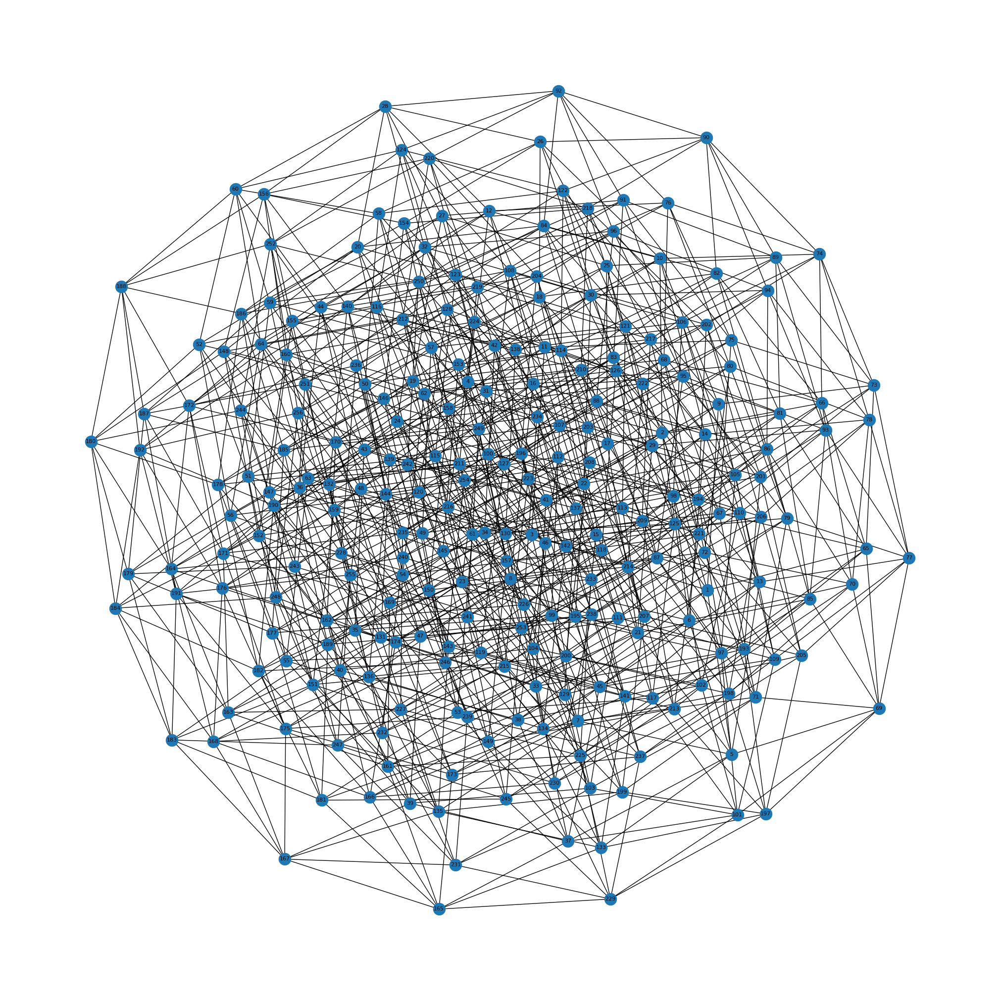

In [545]:


edges = []

for i in range(len(patterns)):
  for j in range(len(patterns)):
    if i <= j:
      differences = np.abs(np.array(patterns[i][0]) - np.array(patterns[j][0]))
      sum = differences.sum()
      if sum == 1:
        edges.append((i+1,j+1))







#  G is the graph object of the

G = nx.Graph()
G.add_edges_from(edges)
pos=nx.spring_layout(G)
plt.figure(1,figsize=(20,20))
nx.draw(G,pos,font_size=8, with_labels=True)





# keys = [n for n in G.nodes()]
# values = patterns
# NODES = {k: v for k, v in zip(keys, values)}



######## each node key is equivalent to a special pattern and its value is the pattern and its energy , for example ; as the patterns vector is a numpy array and starts from 0,we have this : NODES[46] == patterns[45])

NODES = {}
for node , (i,j) in enumerate(patterns):
  # print(i,j,node+1)

  NODES[node+1] = [i,j]




NODE2 = NODES.copy()

NODES




# tHE local minima will be recorded in LM list (definition: the minimum energy among the neighbors) :
LM = []





for node in NODES.keys():

  # # defining the neighbors of node:

  ne =  list(G.neighbors(node))
  # ne.append(node)



# # defining the energy threshold of the current node

  th = NODES[node][1]




# # defining the nergy of the neighbors of the current node:

  energies = [NODES[key][1] for key in ne ]#if key in NODES]



  # print((th <= energies).sum(), th, [energies], node, len(energies))




# # the local minimum must have a energy value that is less than neighbors' energy, it mean that the number of these nodes must be 8 or N :
  if (th < energies).sum() == N :

      print('I am a local minimum. -- ',node ,(th < energies).sum(), th, [energies], node, len(energies))


      LM.append(node)







len(LM)



























print('\n IN LATCHER')


# tHE local minima will be recorded in LM_LATCHER list (definition: the minimum energy among the neighbors) :
LM_LATCHER = []

for node in NODES_LATCHER.keys():

  # # defining the neighbors of node:

  ne =  list(G_LATCHER.neighbors(node))
  # ne.append(node)



# # defining the energy threshold of the current node

  th = NODES_LATCHER[node][1]




# # defining the nergy of the neighbors of the current node:

  energies = [NODES_LATCHER[key][1] for key in ne ]#if key in NODES]



  # print((th <= energies).sum(), th, [energies], node, len(energies))




# # the local minimum must have a energy value that is less than neighbors' energy, it mean that the number of these nodes must be 8 or N :
  if (th < energies).sum() == N :

      print('I am a local minimum. -- ',node ,(th < energies).sum(), th, [energies], node, len(energies))


      LM_LATCHER.append(node)































print('\n IN EXPLORER')
# tHE local minima will be recorded in LM_LATCHER list (definition: the minimum energy among the neighbors) :
LM_EXPLORER = []

for node in NODES_EXPLORER.keys():

  # # defining the neighbors of node:

  ne =  list(G_EXPLORER.neighbors(node))
  # ne.append(node)



# # defining the energy threshold of the current node

  th = NODES_EXPLORER[node][1]




# # defining the nergy of the neighbors of the current node:

  energies = [NODES_EXPLORER[key][1] for key in ne ]#if key in NODES]



  # print((th <= energies).sum(), th, [energies], node, len(energies))




# # the local minimum must have a energy value that is less than neighbors' energy, it mean that the number of these nodes must be 8 or N :
  if (th < energies).sum() == N :

      print('I am a local minimum. -- ',node ,(th < energies).sum(), th, [energies], node, len(energies))


      LM_EXPLORER.append(node)













In [546]:
LM_LATCHER

LM_EXPLORER


LM

[1, 73, 136, 184, 256]

In [547]:
LM_EXPLORER

[1, 89, 184, 256]

In [548]:

LM_LATCHER

[1, 73, 121, 136, 184, 256]

In [549]:
NODES

{1: [[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 2: [[0, 0, 0, 0, 0, 0, 0, 1], 0.3215279044787732],
 3: [[0, 0, 0, 0, 0, 0, 1, 0], 0.7043193153941414],
 4: [[0, 0, 0, 0, 0, 0, 1, 1], 0.7805105110723035],
 5: [[0, 0, 0, 0, 0, 1, 0, 0], 0.20683820425124694],
 6: [[0, 0, 0, 0, 0, 1, 0, 1], 0.3241632797375722],
 7: [[0, 0, 0, 0, 0, 1, 1, 0], 0.6573588347131617],
 8: [[0, 0, 0, 0, 0, 1, 1, 1], 0.5293472013988758],
 9: [[0, 0, 0, 0, 1, 0, 0, 0], 0.9020623429776031],
 10: [[0, 0, 0, 0, 1, 0, 0, 1], 1.385428093378183],
 11: [[0, 0, 0, 0, 1, 0, 1, 0], 2.042378520344247],
 12: [[0, 0, 0, 0, 1, 0, 1, 1], 2.280407561944216],
 13: [[0, 0, 0, 0, 1, 1, 0, 0], 1.2833066824400157],
 14: [[0, 0, 0, 0, 1, 1, 0, 1], 1.5624696038481478],
 15: [[0, 0, 0, 0, 1, 1, 1, 0], 2.169824174874433],
 16: [[0, 0, 0, 0, 1, 1, 1, 1], 2.2036503874819537],
 17: [[0, 0, 0, 1, 0, 0, 0, 0], 1.0140313802483205],
 18: [[0, 0, 0, 1, 0, 0, 0, 1], 1.2589052883810365],
 19: [[0, 0, 0, 1, 0, 0, 1, 0], 1.2837593788699582],
 20: [[0, 0, 0, 1, 

## Domain size of local minma

In [550]:



#NE is the neighbor members


def search_minimum_energy(NE, threshold):

  e = []

  for l in range(len(NE)):

      e.append(NE[l][1])

  m_ind = e.index(min(e))

  if min(e) < threshold:

    return(NE[m_ind][0])


  # ind = next(idx for idx, val in enumerate(e) if val <= threshold)

  return([])


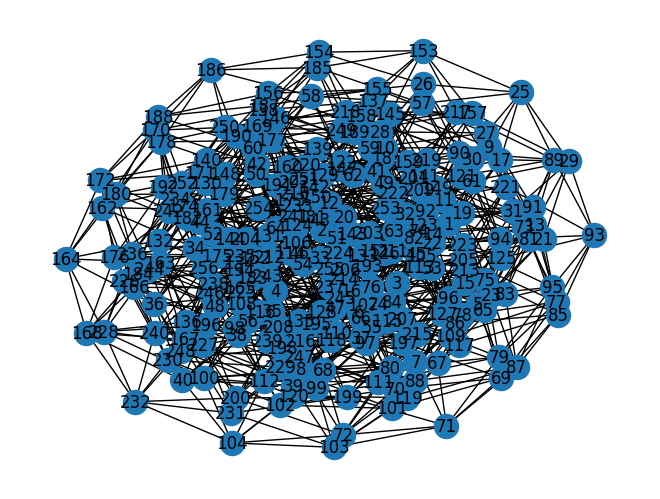

In [551]:
# network construction:

# def edge_list(patterns):

edges = []

for i in range(len(patterns)):
  for j in range(len(patterns)):
    if i <= j:
      differences = np.abs(np.array(patterns[i][0]) - np.array(patterns[j][0]))
      sum = differences.sum()
      if sum == 1:
        edges.append((i+1,j+1))











G = nx.Graph()

G.add_edges_from(edges)

nx.draw(G, with_labels=True)
plt.show()








def basins(G,NODES,ROI):

                label = {}


                for node in range(1,1+ (2**ROI)):



                        ## THE THRESHOLD FOR ENERGY, NOW IS CONSIDERED AS THE ENERGY OF NODE_T

                          node_T = node
                          N = list(G.neighbors(node))
                          # print(N)




                          E_node = NODES[node][1]

                          energies_neighbors = [[n, NODES[n][1]] for n in N]


                          # print(energies_neighbors, E_node)
                          # print(node, 'its node')



                ## T would provide the nodes whose energies are less than current node energy, if there is no node with this condition, then it will be empty:

                          T = search_minimum_energy(energies_neighbors, E_node)




                          print('node, node_T, n, T, energies_neighbors',node, node_T, N, T, energies_neighbors)

                          print(energies_neighbors, 'energies_neighbors')





                          track =[]
                          track.append(node_T)


                          if T != []:
                              N = list(G.neighbors(T))

                              # print(T)


                              # T = node that has energy < E_node


                              while T != []:



                                  track.append(T)


                                  node_T = T
                                  N = list(G.neighbors(node_T))


                                    # print(N)


                                  E_T = NODES[node_T][1]


                                  energies_neighbors = [[n, NODES[n][1]] for n in N]

                                  T = search_minimum_energy(energies_neighbors, E_T)

                                  track.append(T)

                          print(node, track)
                          label[node] = node_T



                return(label)


In [552]:
label = basins(G,NODES,ROI)


label_LATCHER = basins(G_LATCHER , NODES_LATCHER,ROI)


label_EXPLORER = basins(G_EXPLORER , NODES_EXPLORER,ROI)

node, node_T, n, T, energies_neighbors 1 1 [2, 3, 5, 9, 17, 33, 65, 129] [] [[2, 0.3215279044787732], [3, 0.7043193153941414], [5, 0.20683820425124694], [9, 0.9020623429776031], [17, 1.0140313802483205], [33, 0.806976158027427], [65, 0.780513635254141], [129, 0.9322942664000413]]
[[2, 0.3215279044787732], [3, 0.7043193153941414], [5, 0.20683820425124694], [9, 0.9020623429776031], [17, 1.0140313802483205], [33, 0.806976158027427], [65, 0.780513635254141], [129, 0.9322942664000413]] energies_neighbors
1 [1]
node, node_T, n, T, energies_neighbors 2 2 [1, 4, 6, 10, 18, 34, 66, 130] 1 [[1, -0.0], [4, 0.7805105110723035], [6, 0.3241632797375722], [10, 1.385428093378183], [18, 1.2589052883810365], [34, 0.7416578550514055], [66, 1.3074516553441522], [130, 1.216663766150441]]
[[1, -0.0], [4, 0.7805105110723035], [6, 0.3241632797375722], [10, 1.385428093378183], [18, 1.2589052883810365], [34, 0.7416578550514055], [66, 1.3074516553441522], [130, 1.216663766150441]] energies_neighbors
2 [2, 1, []]

In [553]:
set(label.values())

{1, 73, 136, 184, 256}

In [554]:
from collections import Counter

BASIN_SIZE = Counter(list(label.values())) #Counter(L)

for key in BASIN_SIZE.keys():
  # if c[key] >= 1 :
    print(key, 'its basin size is :', BASIN_SIZE[key] , 'its pattern and energy are :', NODES[key] )












BASIN_SIZE_LATCHER = Counter(list(label_LATCHER.values())) #Counter(L)

for key in BASIN_SIZE_LATCHER.keys():
  # if c[key] >= 1 :
    print('LATCHERS',key, 'its basin size is :', BASIN_SIZE_LATCHER[key] , 'its pattern and energy are :', NODES_LATCHER[key] )











BASIN_SIZE_EXPLORER = Counter(list(label_EXPLORER.values())) #Counter(L)

for key in BASIN_SIZE_EXPLORER.keys():
  # if c[key] >= 1 :
    print('EXPLORERS: ', key, 'its basin size is :', BASIN_SIZE_EXPLORER[key] , 'its pattern and energy are :', NODES_EXPLORER[key] )

1 its basin size is : 90 its pattern and energy are : [[0, 0, 0, 0, 0, 0, 0, 0], -0.0]
73 its basin size is : 39 its pattern and energy are : [[0, 1, 0, 0, 1, 0, 0, 0], 0.4811963002071138]
184 its basin size is : 35 its pattern and energy are : [[1, 0, 1, 1, 0, 1, 1, 1], 0.4283288285472664]
256 its basin size is : 80 its pattern and energy are : [[1, 1, 1, 1, 1, 1, 1, 1], 0.1160304112319146]
136 its basin size is : 12 its pattern and energy are : [[1, 0, 0, 0, 0, 1, 1, 1], 0.4346497026857099]
LATCHERS 1 its basin size is : 93 its pattern and energy are : [[0, 0, 0, 0, 0, 0, 0, 0], -0.0]
LATCHERS 73 its basin size is : 26 its pattern and energy are : [[0, 1, 0, 0, 1, 0, 0, 0], 0.467295848037965]
LATCHERS 256 its basin size is : 84 its pattern and energy are : [[1, 1, 1, 1, 1, 1, 1, 1], 0.0938227550331856]
LATCHERS 184 its basin size is : 12 its pattern and energy are : [[1, 0, 1, 1, 0, 1, 1, 1], 0.3995926532345222]
LATCHERS 121 its basin size is : 11 its pattern and energy are : [[0, 1,

In [555]:
LM

[1, 73, 136, 184, 256]

## Major and Minor local minima

In [556]:
major_local = [136,121]
minor_local = [256,1]






major_local_LATCHERS = [1]
minor_local_LATCHERS = [256]





major_local_EXPLORERS = [1]
minor_local_EXPLORERS = [256]











In [557]:
NODES[136]




[[1, 0, 0, 0, 0, 1, 1, 1], 0.4346497026857099]

In [558]:
NODES_LATCHER[136]

[[1, 0, 0, 0, 0, 1, 1, 1], 0.3883435917116942]

In [559]:
print(H_rand, '\n',H_explorers,'\n' ,H_latcher)

[-0.93229427 -0.78051364 -0.80697616 -1.01403138 -0.90206234 -0.2068382
 -0.70431932 -0.3215279 ] 
 [-1.04979602 -0.93976761 -0.80439867 -0.83476687 -0.83613297 -0.20512374
 -0.76652551 -0.52696281] 
 [-0.84758695 -0.68176596 -0.8042246  -1.14707705 -0.95775939 -0.20211443
 -0.66933757 -0.18889137]


In [560]:
print(J_rand, '\n ----------',J_explorers,'\n ---------' ,J_latcher)

[[ 0.         -0.05475576  0.23376247  0.05443587  0.51940542  0.69218091
   0.29765245  0.0371584 ]
 [-0.05475576  0.          0.27629891  0.46275557  1.20137968 -0.49667726
   0.27567553 -0.20541012]
 [ 0.23376247  0.27629891  0.          0.24844716  0.24477048 -0.19867935
   0.35341587  0.38684621]
 [ 0.05443587  0.46275557  0.24844716  0.          0.54367278  0.23785488
   0.43459132  0.076654  ]
 [ 0.51940542  1.20137968  0.24477048  0.54367278  0.         -0.17440614
  -0.43599686 -0.16183785]
 [ 0.69218091 -0.49667726 -0.19867935  0.23785488 -0.17440614  0.
   0.25379868  0.20420283]
 [ 0.29765245  0.27567553  0.35341587  0.43459132 -0.43599686  0.25379868
   0.          0.24533671]
 [ 0.0371584  -0.20541012  0.38684621  0.076654   -0.16183785  0.20420283
   0.24533671  0.        ]] 
 ---------- [[ 0.          0.14415713  0.25738037 -0.03739777  0.34998178  0.78680046
   0.33873329  0.13025502]
 [ 0.14415713  0.          0.51834159  0.34837373  1.28139972 -0.4858749
   0.2199737

In [561]:
generate_combinations(N, H_rand, J_rand)





[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 0.3215279044787732],
 [[0, 0, 0, 0, 0, 0, 1, 0], 0.7043193153941414],
 [[0, 0, 0, 0, 0, 0, 1, 1], 0.7805105110723035],
 [[0, 0, 0, 0, 0, 1, 0, 0], 0.20683820425124694],
 [[0, 0, 0, 0, 0, 1, 0, 1], 0.3241632797375722],
 [[0, 0, 0, 0, 0, 1, 1, 0], 0.6573588347131617],
 [[0, 0, 0, 0, 0, 1, 1, 1], 0.5293472013988758],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.9020623429776031],
 [[0, 0, 0, 0, 1, 0, 0, 1], 1.385428093378183],
 [[0, 0, 0, 0, 1, 0, 1, 0], 2.042378520344247],
 [[0, 0, 0, 0, 1, 0, 1, 1], 2.280407561944216],
 [[0, 0, 0, 0, 1, 1, 0, 0], 1.2833066824400157],
 [[0, 0, 0, 0, 1, 1, 0, 1], 1.5624696038481478],
 [[0, 0, 0, 0, 1, 1, 1, 0], 2.169824174874433],
 [[0, 0, 0, 0, 1, 1, 1, 1], 2.2036503874819537],
 [[0, 0, 0, 1, 0, 0, 0, 0], 1.0140313802483205],
 [[0, 0, 0, 1, 0, 0, 0, 1], 1.2589052883810365],
 [[0, 0, 0, 1, 0, 0, 1, 0], 1.2837593788699582],
 [[0, 0, 0, 1, 0, 0, 1, 1], 1.2832965782020629],
 [[0, 0, 0, 1, 0, 1, 0, 0], 0.9830147

In [562]:
generate_combinations(N, H_latcher, J_latcher)

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 0.18889137012850568],
 [[0, 0, 0, 0, 0, 0, 1, 0], 0.6693375688625415],
 [[0, 0, 0, 0, 0, 0, 1, 1], 0.6654358525656641],
 [[0, 0, 0, 0, 0, 1, 0, 0], 0.20211443495628584],
 [[0, 0, 0, 0, 0, 1, 0, 1], 0.27932806299762203],
 [[0, 0, 0, 0, 0, 1, 1, 0], 0.5321819682372443],
 [[0, 0, 0, 0, 0, 1, 1, 1], 0.41660250985319747],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.9577593924343969],
 [[0, 0, 0, 0, 1, 0, 0, 1], 1.32783828280641],
 [[0, 0, 0, 0, 1, 0, 1, 0], 2.1578453545613727],
 [[0, 0, 0, 0, 1, 0, 1, 1], 2.335131158508003],
 [[0, 0, 0, 0, 1, 1, 0, 0], 1.3185143720752739],
 [[0, 0, 0, 0, 1, 1, 0, 1], 1.5769155203601173],
 [[0, 0, 0, 0, 1, 1, 1, 0], 2.179330298620666],
 [[0, 0, 0, 0, 1, 1, 1, 1], 2.244938360480127],
 [[0, 0, 0, 1, 0, 0, 0, 0], 1.147077050908923],
 [[0, 0, 0, 1, 0, 0, 0, 1], 1.260863454876884],
 [[0, 0, 0, 1, 0, 0, 1, 0], 1.4262310994543514],
 [[0, 0, 0, 1, 0, 0, 1, 1], 1.3472244169969296],
 [[0, 0, 0, 1, 0, 1, 0, 0], 1.0246117

In [563]:

generate_combinations(N, H_explorers, J_explorers)

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 0.5269628050757985],
 [[0, 0, 0, 0, 0, 0, 1, 0], 0.7665255100769096],
 [[0, 0, 0, 0, 0, 0, 1, 1], 0.9651652873378902],
 [[0, 0, 0, 0, 0, 1, 0, 0], 0.20512373539541925],
 [[0, 0, 0, 0, 0, 1, 0, 1], 0.38573157517089174],
 [[0, 0, 0, 0, 0, 1, 1, 0], 0.8486152981411014],
 [[0, 0, 0, 0, 0, 1, 1, 1], 0.7009001101017559],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.83613297134154],
 [[0, 0, 0, 0, 1, 0, 0, 1], 1.4856427922053386],
 [[0, 0, 0, 0, 1, 0, 1, 0], 1.8964974935666326],
 [[0, 0, 0, 0, 1, 0, 1, 1], 2.2176842866156137],
 [[0, 0, 0, 0, 1, 1, 0, 0], 1.227962352153706],
 [[0, 0, 0, 0, 1, 1, 0, 1], 1.5311172077171789],
 [[0, 0, 0, 0, 1, 1, 1, 0], 2.165292927047571],
 [[0, 0, 0, 0, 1, 1, 1, 1], 2.1401247547962257],
 [[0, 0, 0, 1, 0, 0, 0, 0], 0.8347668670708361],
 [[0, 0, 0, 1, 0, 0, 0, 1], 1.2713140559170992],
 [[0, 0, 0, 1, 0, 0, 1, 0], 1.1056418271535988],
 [[0, 0, 0, 1, 0, 0, 1, 1], 1.2138659881850442],
 [[0, 0, 0, 1, 0, 1, 0, 0], 0.924870

In [564]:
patterns

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 0.3215279044787732],
 [[0, 0, 0, 0, 0, 0, 1, 0], 0.7043193153941414],
 [[0, 0, 0, 0, 0, 0, 1, 1], 0.7805105110723035],
 [[0, 0, 0, 0, 0, 1, 0, 0], 0.20683820425124694],
 [[0, 0, 0, 0, 0, 1, 0, 1], 0.3241632797375722],
 [[0, 0, 0, 0, 0, 1, 1, 0], 0.6573588347131617],
 [[0, 0, 0, 0, 0, 1, 1, 1], 0.5293472013988758],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.9020623429776031],
 [[0, 0, 0, 0, 1, 0, 0, 1], 1.385428093378183],
 [[0, 0, 0, 0, 1, 0, 1, 0], 2.042378520344247],
 [[0, 0, 0, 0, 1, 0, 1, 1], 2.280407561944216],
 [[0, 0, 0, 0, 1, 1, 0, 0], 1.2833066824400157],
 [[0, 0, 0, 0, 1, 1, 0, 1], 1.5624696038481478],
 [[0, 0, 0, 0, 1, 1, 1, 0], 2.169824174874433],
 [[0, 0, 0, 0, 1, 1, 1, 1], 2.2036503874819537],
 [[0, 0, 0, 1, 0, 0, 0, 0], 1.0140313802483205],
 [[0, 0, 0, 1, 0, 0, 0, 1], 1.2589052883810365],
 [[0, 0, 0, 1, 0, 0, 1, 0], 1.2837593788699582],
 [[0, 0, 0, 1, 0, 0, 1, 1], 1.2832965782020629],
 [[0, 0, 0, 1, 0, 1, 0, 0], 0.9830147

In [565]:

patterns_LATCHER

[[[0, 0, 0, 0, 0, 0, 0, 0], -0.0],
 [[0, 0, 0, 0, 0, 0, 0, 1], 0.18889137012850568],
 [[0, 0, 0, 0, 0, 0, 1, 0], 0.6693375688625415],
 [[0, 0, 0, 0, 0, 0, 1, 1], 0.6654358525656641],
 [[0, 0, 0, 0, 0, 1, 0, 0], 0.20211443495628584],
 [[0, 0, 0, 0, 0, 1, 0, 1], 0.27932806299762203],
 [[0, 0, 0, 0, 0, 1, 1, 0], 0.5321819682372443],
 [[0, 0, 0, 0, 0, 1, 1, 1], 0.41660250985319747],
 [[0, 0, 0, 0, 1, 0, 0, 0], 0.9577593924343969],
 [[0, 0, 0, 0, 1, 0, 0, 1], 1.32783828280641],
 [[0, 0, 0, 0, 1, 0, 1, 0], 2.1578453545613727],
 [[0, 0, 0, 0, 1, 0, 1, 1], 2.335131158508003],
 [[0, 0, 0, 0, 1, 1, 0, 0], 1.3185143720752739],
 [[0, 0, 0, 0, 1, 1, 0, 1], 1.5769155203601173],
 [[0, 0, 0, 0, 1, 1, 1, 0], 2.179330298620666],
 [[0, 0, 0, 0, 1, 1, 1, 1], 2.244938360480127],
 [[0, 0, 0, 1, 0, 0, 0, 0], 1.147077050908923],
 [[0, 0, 0, 1, 0, 0, 0, 1], 1.260863454876884],
 [[0, 0, 0, 1, 0, 0, 1, 0], 1.4262310994543514],
 [[0, 0, 0, 1, 0, 0, 1, 1], 1.3472244169969296],
 [[0, 0, 0, 1, 0, 1, 0, 0], 1.0246117

# Random walk simulation

In [566]:
LM

[1, 73, 136, 184, 256]

In [567]:
# Based on the paper, we have to simulate the random walk for each group initiallized with a random step for 10^5 times.
# What I grassped is that, we should

In [568]:

def Random_walk(G, NODES):

          # initial state :
          init_state = random.choice(list(G.nodes()))
          current_state = init_state
          TIME = 10**5



          trajectory = []

          for time in range(TIME):



              trajectory.append(current_state)


              r = random.uniform(0, 1)



              e_current = NODES[current_state][1]

              neighbors = list(G.neighbors(current_state))




              p = np.array([ min(1, (np.exp(NODES[current_state][1] - (NODES[e][1])))) for e in neighbors ] )


              normalterm = np.sum(np.array([ min(1, (np.exp(NODES[current_state][1] - (NODES[e][1])))) for e in list(G.neighbors(current_state))] ))


              p = p/normalterm

              # print(p)


              new_state = np.random.choice(list(G.neighbors(current_state)), p = p)


              P = p[np.argmax(p)]



              # BASED on MCMC method, we accept just the new state with probability of p:



              if r <= P:

                current_state = new_state





          #### now remove the first 100 step of the trajectory vector since they are trying to keep the system in a good manner :


          trajectory = trajectory[100:]

          return(trajectory)




In [569]:
LM

[1, 73, 136, 184, 256]

In [570]:


def transition_frequency(G,NODES, LM):

            from collections import Counter, defaultdict

            trajectory = Random_walk(G,NODES)


            # List of special states to track
            special_states = LM

            # Compute frequency of major local minima
            state_counter = Counter([x for x in trajectory if x in special_states])

            # Track transitions before and after each special state
            transitions = defaultdict(list)

            for i, state in enumerate(trajectory):
                if state in special_states:
                    # Capture the before and after states if they exist
                    before = trajectory[i-1] if i > 0 else None
                    after = trajectory[i+1] if i < len(trajectory) - 1 else None
                    transitions[state].append((before, after))


            print("Frequency of special states:", state_counter)
            print("Transitions around special states:")
            for state, trans in transitions.items():
                print(f"State {state}: {trans}")








            sorted_frequent_transitions = {}

            for state, trans_list in transitions.items():
                # Count the frequency of each (before, after) tuple
                transition_counter = Counter(trans_list)
                # Get all transitions sorted by frequency
                sorted_transitions = transition_counter.most_common()
                sorted_frequent_transitions[state] = sorted_transitions

            print("Sorted frequency of transitions for each special state:")
            for state, sorted_trans in sorted_frequent_transitions.items():
                print(f"\nState {state}:")
                for trans_tuple, frequency in sorted_trans:
                    print(f"  Transition {trans_tuple}: occurred {frequency} times")





            return(sorted_frequent_transitions, trajectory)



In [571]:
sorted_frequent_transitions, trajectory = transition_frequency(G, NODES, LM)

Frequency of special states: Counter({256: 888, 184: 627, 1: 615, 136: 615, 73: 574})
Transitions around special states:
State 1: [(5, 1), (1, 1), (1, 1), (1, 1), (1, 17), (9, 5), (5, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 5), (5, 1), (1, 1), (1, 2), (5, 1), (1, 1), (1, 1), (1, 1), (1, 65), (65, 65), (5, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 9), (9, 65), (65, 1), (1, 1), (1, 1), (1, 1), (1, 2), (2, 9), (17, 65), (65, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 33), (5, 1), (1, 1), (1, 1), (1, 1), (1, 3), (3, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 5), (3, 5), (3, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 33), (33, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 9), (3, 129), (5, 65), (33, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 1), (1, 65), (65, 1), (1, 5), (33, 1), (1, 5), (33, 1), (1, 1), (1, 1), (1, 9), (129, 1), (1, 3), (3, 1), (1, 1),

In [572]:
sorted_frequent_transitions_LATCHER, trajectory_LATCHER = transition_frequency(G_LATCHER, NODES_LATCHER, LM_LATCHER)




Frequency of special states: Counter({1: 752, 256: 652, 136: 609, 73: 601, 121: 592, 184: 563})
Transitions around special states:
State 121: [(57, 121), (121, 121), (121, 121), (121, 121), (121, 249), (122, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 89), (105, 121), (121, 123), (122, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 113), (123, 121), (121, 123), (249, 121), (121, 122), (105, 121), (121, 125), (122, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 249), (249, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 89), (105, 121), (121, 249), (89, 121), (121, 121), (121, 121), (121, 121), (121, 121), (121, 121

In [573]:
sorted_frequent_transitions_EXPLORER, trajectory_EXPLORER = transition_frequency(G_EXPLORER, NODES_EXPLORER, LM_EXPLORER)


Frequency of special states: Counter({1: 867, 256: 840, 89: 615, 184: 591})
Transitions around special states:
State 89: [(91, 89), (89, 89), (89, 89), (89, 73), (25, 89), (89, 89), (89, 217), (91, 89), (89, 89), (89, 89), (89, 89), (89, 90), (91, 89), (89, 89), (89, 89), (89, 81), (90, 89), (89, 89), (89, 89), (89, 93), (25, 89), (89, 89), (89, 89), (89, 89), (89, 81), (121, 89), (89, 73), (81, 89), (89, 89), (89, 91), (121, 89), (89, 89), (89, 217), (121, 89), (89, 89), (89, 89), (89, 89), (89, 89), (89, 89), (89, 91), (91, 89), (89, 89), (89, 93), (93, 73), (81, 89), (89, 89), (89, 89), (89, 121), (73, 89), (89, 89), (89, 121), (217, 89), (89, 89), (89, 89), (89, 89), (89, 89), (89, 25), (25, 89), (89, 89), (89, 73), (91, 89), (89, 81), (90, 73), (73, 89), (89, 121), (90, 89), (89, 89), (89, 90), (90, 89), (89, 89), (89, 89), (89, 89), (89, 91), (91, 121), (81, 89), (89, 89), (89, 121), (121, 89), (89, 89), (89, 89), (89, 89), (89, 89), (89, 89), (89, 89), (89, 89), (89, 89), (89, 1

In [574]:
LM

[1, 73, 136, 184, 256]

In [575]:
LM_LATCHER

[1, 73, 121, 136, 184, 256]

In [576]:
LM_EXPLORER

[1, 89, 184, 256]

# Disconnectivity graph

In [479]:
NODES.items()

dict_items([(1, [[0, 0, 0, 0, 0, 0, 0, 0], -0.0]), (2, [[0, 0, 0, 0, 0, 0, 0, 1], 0.07197779591875775]), (3, [[0, 0, 0, 0, 0, 0, 1, 0], 0.7386500724880002]), (4, [[0, 0, 0, 0, 0, 0, 1, 1], 0.49535474510311744]), (5, [[0, 0, 0, 0, 0, 1, 0, 0], 0.18851290451479077]), (6, [[0, 0, 0, 0, 0, 1, 0, 1], 0.10761735076612308]), (7, [[0, 0, 0, 0, 0, 1, 1, 0], 0.7752484583380655]), (8, [[0, 0, 0, 0, 0, 1, 1, 1], 0.37907978128575737]), (9, [[0, 0, 0, 0, 1, 0, 0, 0], 0.80990990045543]), (10, [[0, 0, 0, 0, 1, 0, 0, 1], 1.206505264172824]), (11, [[0, 0, 0, 0, 1, 0, 1, 0], 1.8898368782613315]), (12, [[0, 0, 0, 0, 1, 0, 1, 1], 1.971159118675085]), (13, [[0, 0, 0, 0, 1, 1, 0, 0], 1.086080029226225]), (14, [[0, 0, 0, 0, 1, 1, 0, 1], 1.3298020432761932]), (15, [[0, 0, 0, 0, 1, 1, 1, 0], 2.0140924883674014]), (16, [[0, 0, 0, 0, 1, 1, 1, 1], 1.942541379113729]), (17, [[0, 0, 0, 1, 0, 0, 0, 0], 0.7208586168129357]), (18, [[0, 0, 0, 1, 0, 0, 0, 1], 0.7829193457514285]), (19, [[0, 0, 0, 1, 0, 0, 1, 0], 0.974539

In [577]:

def build_disconnectivity_graph(G, NODES, LM, RUN_number , Type):


    import numpy as np
    # Sort nodes by their energy values in descending order
    sorted_nodes = sorted(NODES.items(), key=lambda x: x[1][1], reverse=True)

    # Initialize the threshold energy level (Eth) as the largest energy value
    Eth = sorted_nodes[0][1][1]

    # Initialize list to store disconnection events
    disconnection_events = {}

    while sorted_nodes:
        # Step (iii): Remove nodes whose energy values are greater than or equal to Eth
        current_nodes = [node for node, data in sorted_nodes if data[1] < Eth]

        # Ensure local minima remain in the reduced graph
        current_nodes = list(set(current_nodes) | set(LM))

        # Create a subgraph with the remaining nodes
        subG = G.subgraph(current_nodes).copy()

        # Check if each pair of local minima is connected within the subgraph
        for i in range(len(LM)):
            for j in range(i + 1, len(LM)):
                lm1, lm2 = LM[i], LM[j]

                # If local minima are disconnected, record the event
                if not nx.has_path(subG, lm1, lm2):
                    node_th = sorted_nodes[0][0]  # Get the node causing the disconnection







                    if ((lm1 , lm2) or (lm2,lm1)) not in disconnection_events.keys():
                      disconnection_events[(lm1, lm2)] =  Eth #[node_th, Eth,

                      print(f"Disconnected: {lm1} and {lm2} at node {node_th} with energy {Eth}, DISTANCE is {Eth}")
                      visualize_graph(subG, Eth, LM, node_th)


        # Visualize the reduced graph at the current threshold
        node_th = sorted_nodes[0][0]  # Get the node with the current threshold energy
        # visualize_graph(subG, Eth, LM, node_th)

        # Step (v): Move Eth down to the next largest energy value
        sorted_nodes = sorted_nodes[1:]
        if sorted_nodes:
            Eth = sorted_nodes[0][1][1]





# plotting the dendogram

    import numpy as np
    import scipy.cluster.hierarchy as sch
    import matplotlib.pyplot as plt
    import json


    # Given distances and feature labels
    distance_dict = disconnection_events

    converted_dict = {str(k): v for k, v in disconnection_events.items()}



    # List of features
    features = LM #[1, 73, 184, 256]
    num_features = len(features)

    # Create a distance matrix
    distance_matrix = np.zeros((num_features, num_features))

    # Map feature indices to positions in the distance matrix
    feature_index = {feature: idx for idx, feature in enumerate(features)}

    # Fill the distance matrix using the values from the dictionary
    for (f1, f2), distance in distance_dict.items():
        idx1, idx2 = feature_index[f1], feature_index[f2]
        distance_matrix[idx1, idx2] = distance
        distance_matrix[idx2, idx1] = distance  # Make it symmetric

    # Convert to condensed form for linkage function
    condensed_distances = sch.distance.squareform(distance_matrix)







    LM_ENERGY = [NODES[i][1] for i in LM]

    # ###### saving json file:
    with open('DISTANCE_DENDROGRAM{0}({1}).json'.format(RUN_number,Type), 'w') as f:
      json.dump({'distance matrix': distance_matrix.tolist(), 'LM energy': LM_ENERGY, 'LM':LM, 'distance dictionary':converted_dict }, f)

# 'distance dictionary': disconnection_events









    # Perform hierarchical clustering
    # Z = sch.linkage(condensed_distances, method='average')

    # # Plot the dendrogram
    # plt.figure(figsize=(8, 5))
    # sch.dendrogram(Z, labels=[str(f) for f in features])
    # plt.title("Hierarchical Clustering Dendrogram ({0})".format(Type) )
    # plt.xlabel("Local minimum")
    # plt.ylabel("Distance")
    # plt.grid(True)
    # plt.tight_layout()
    # plt.show()


    return disconnection_events, distance_matrix, condensed_distances

def visualize_graph(subG, Eth, LM, node_th):
    """
    Visualizes the reduced graph at each threshold level, coloring the local minima nodes.
    """
    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(subG)  # Layout for better visualization

    # Draw all nodes with lightblue color by default
    nx.draw(subG, pos, with_labels=True, node_color='lightblue', edge_color='gray', node_size=500)

    # Highlight the local minima nodes in green
    lm_nodes = [node for node in subG.nodes if node in LM]
    nx.draw_networkx_nodes(subG, pos, nodelist=lm_nodes, node_color='lightgreen', node_size = 500 )

    # Add a title with the current threshold energy level and the node causing it
    plt.title(f'Reduced Graph at Eth = {Eth:.4f} | Node causing threshold: {node_th}')


    nx.draw_networkx_labels(subG, pos, font_size=12)

    plt.show()

In [580]:
LM

[1, 73, 136, 184, 256]

In [579]:
LM_LATCHER

[1, 73, 121, 136, 184, 256]

In [578]:
LM_EXPLORER

[1, 89, 184, 256]

In [520]:
# disconnection_events, distance, condensed_distances  = build_disconnectivity_graph(G, NODES,LM, RUN_number, 'Total subjects')


In [481]:
distance

array([[0.        , 0.73973572, 0.73973572, 0.73973572],
       [0.73973572, 0.        , 0.73392598, 0.73392598],
       [0.73973572, 0.73392598, 0.        , 0.68386005],
       [0.73973572, 0.73392598, 0.68386005, 0.        ]])

In [482]:
for i in LM:

  print(i, NODES[i][1])

1 -0.0
121 0.15090223572361072
136 0.09321235280022888
256 0.061628486254418746


In [523]:
disconnection_events

{(1, 73): 0.8458452908821638,
 (1, 184): 0.8458452908821638,
 (1, 256): 0.8458452908821638,
 (73, 184): 0.10638134174238689,
 (184, 256): 0.8201170838332237,
 (73, 256): 0.8150461407006566}

In [581]:

RUN_number

'Rest2'

Disconnected: 1 and 121 at node 192 with energy 0.698393255362618, DISTANCE is 0.698393255362618


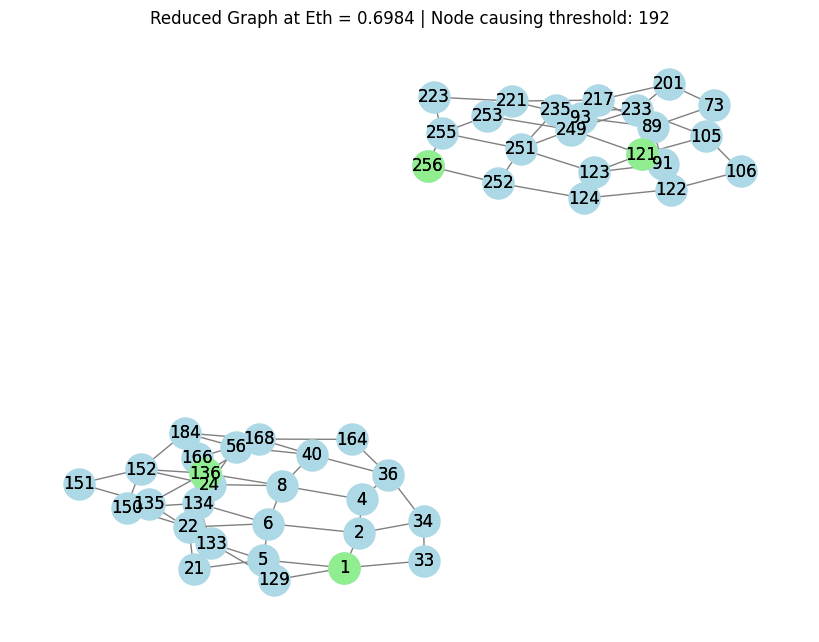

Disconnected: 1 and 256 at node 192 with energy 0.698393255362618, DISTANCE is 0.698393255362618


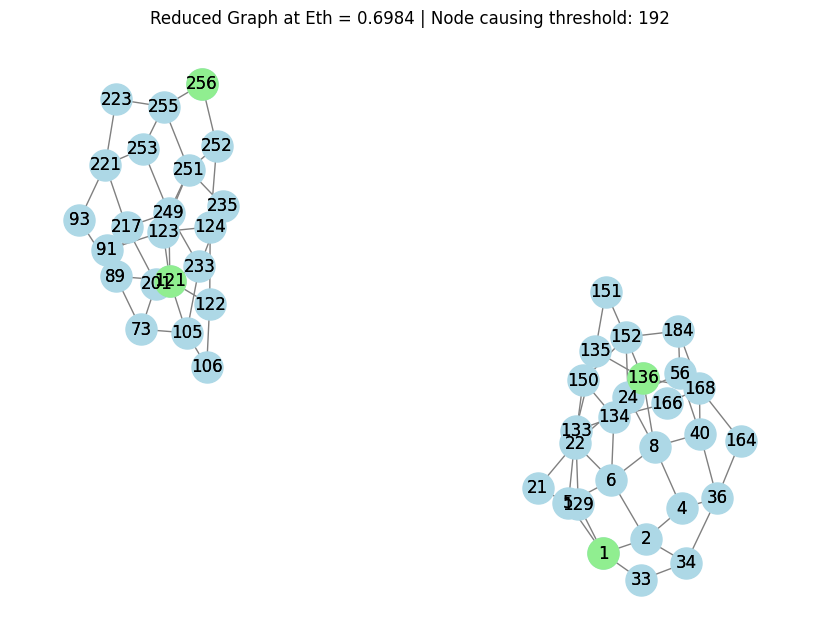

Disconnected: 121 and 136 at node 192 with energy 0.698393255362618, DISTANCE is 0.698393255362618


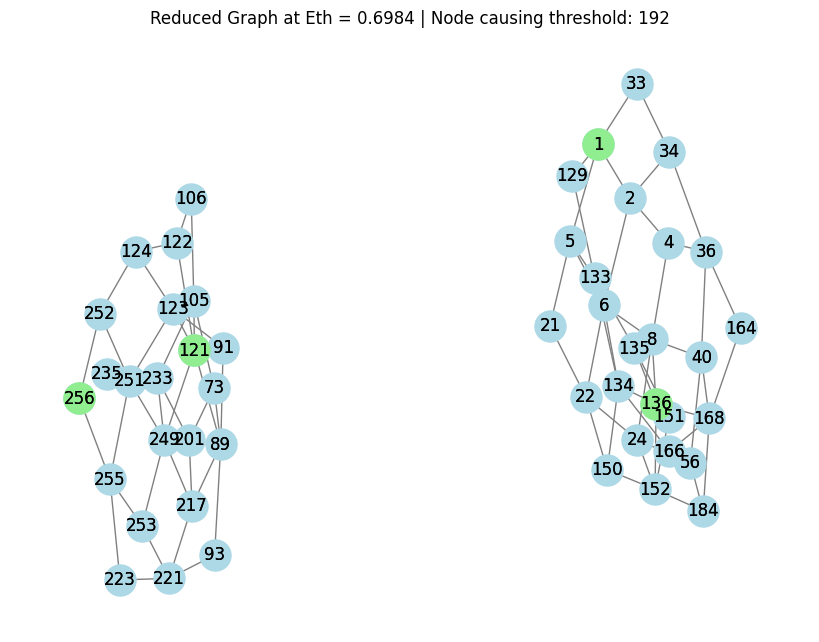

Disconnected: 136 and 256 at node 192 with energy 0.698393255362618, DISTANCE is 0.698393255362618


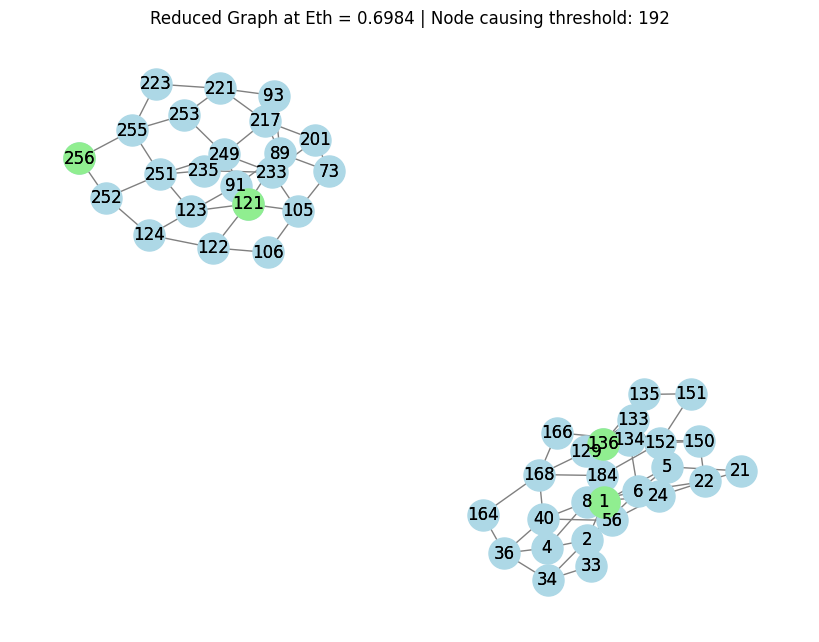

Disconnected: 121 and 256 at node 123 with energy 0.2072546354130722, DISTANCE is 0.2072546354130722


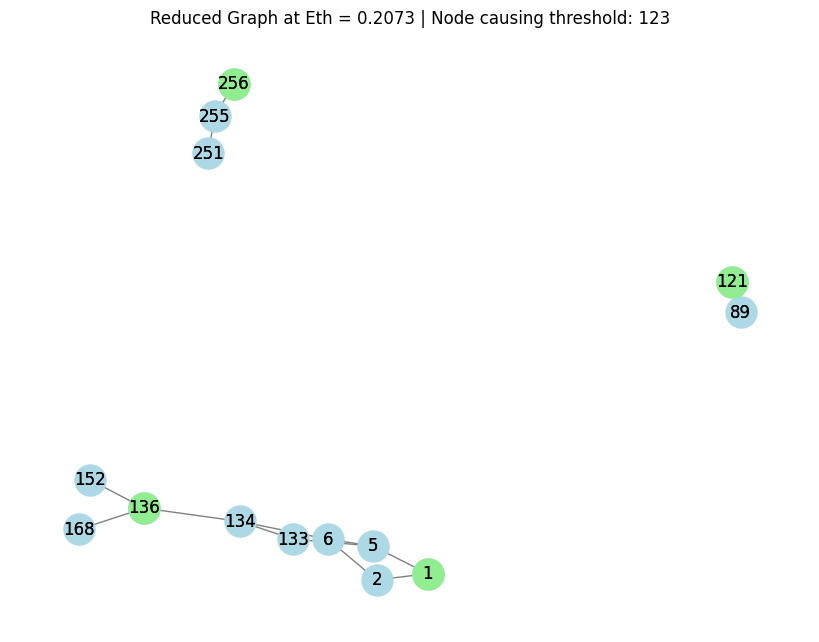

Disconnected: 1 and 136 at node 134 with energy 0.14097913887242441, DISTANCE is 0.14097913887242441


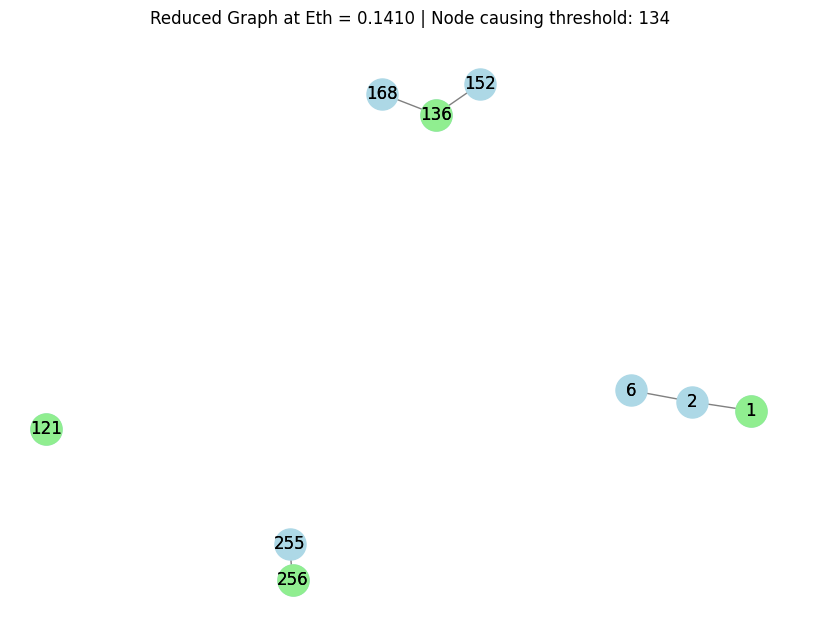

Disconnected: 1 and 89 at node 192 with energy 0.5590647705888641, DISTANCE is 0.5590647705888641


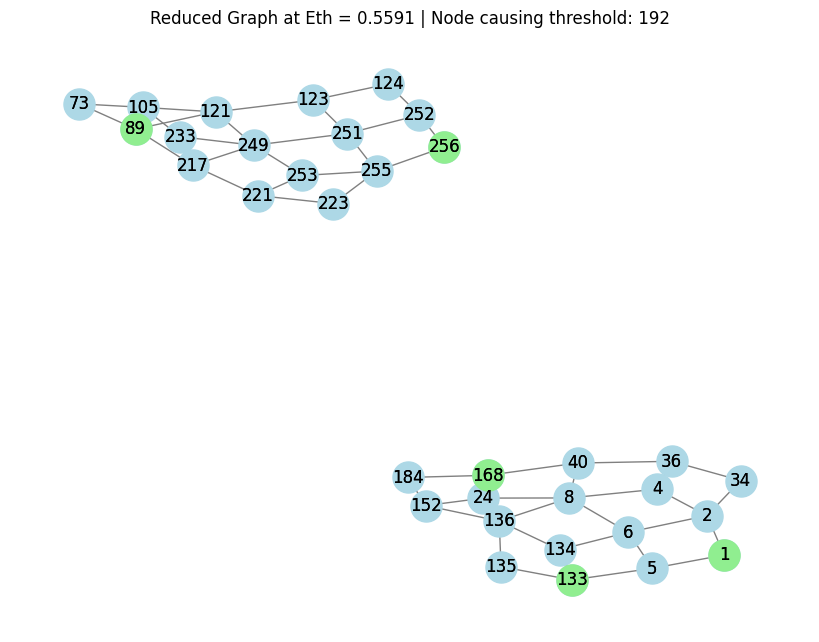

Disconnected: 1 and 256 at node 192 with energy 0.5590647705888641, DISTANCE is 0.5590647705888641


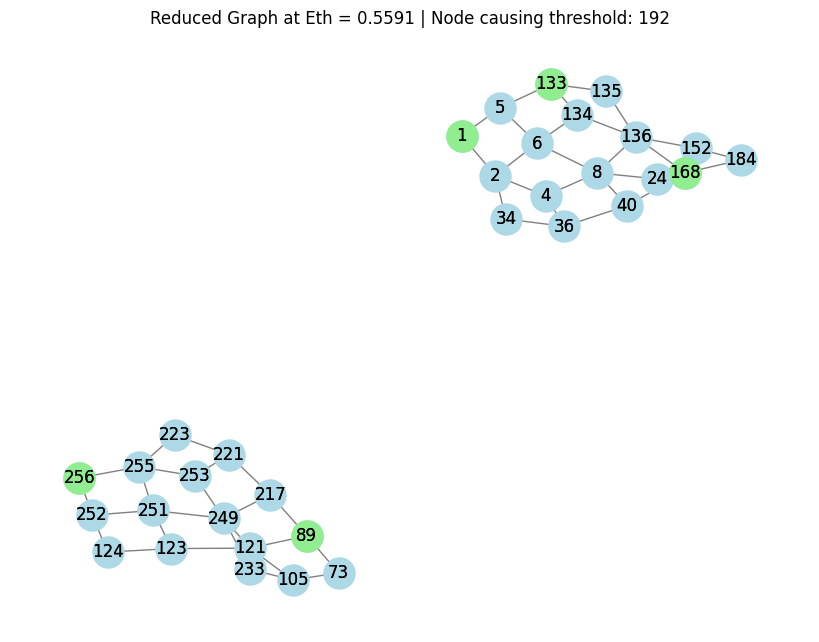

Disconnected: 89 and 133 at node 192 with energy 0.5590647705888641, DISTANCE is 0.5590647705888641


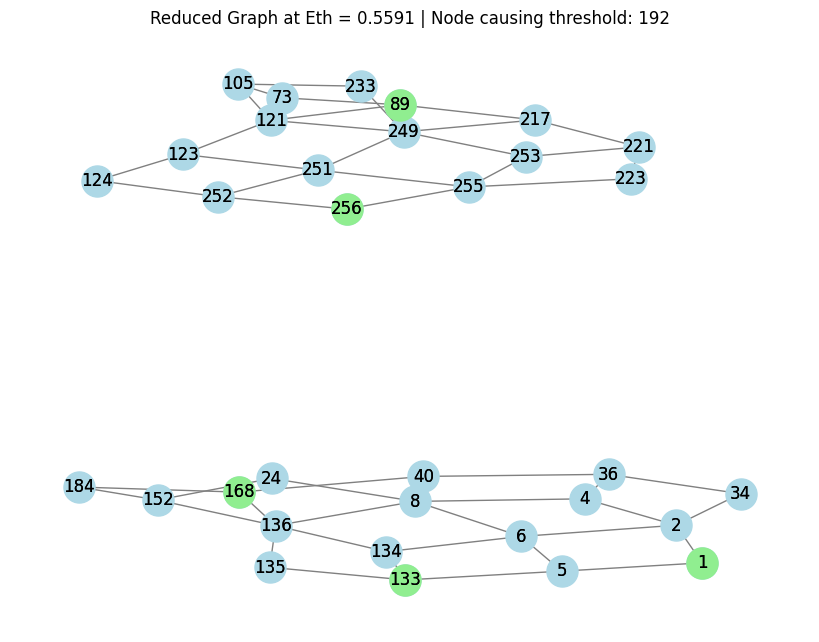

Disconnected: 89 and 168 at node 192 with energy 0.5590647705888641, DISTANCE is 0.5590647705888641


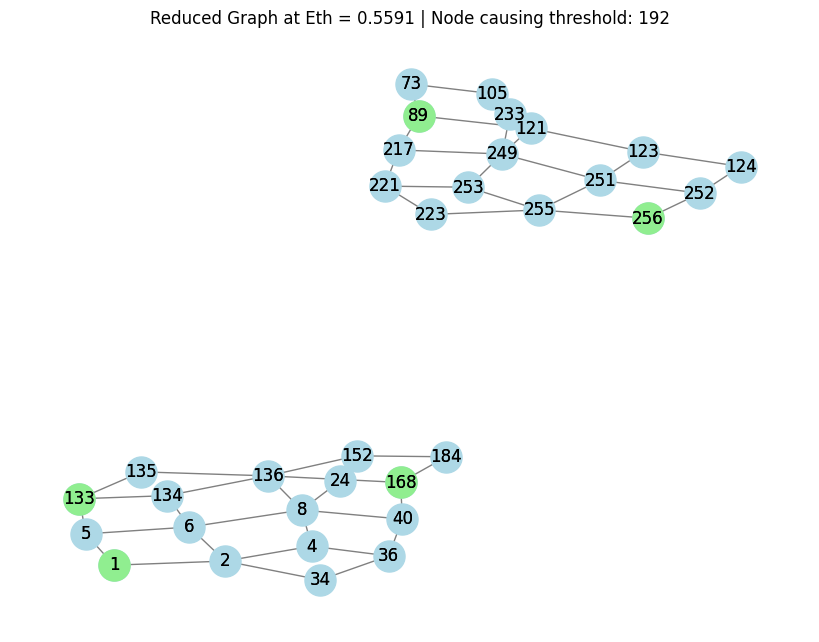

Disconnected: 133 and 256 at node 192 with energy 0.5590647705888641, DISTANCE is 0.5590647705888641


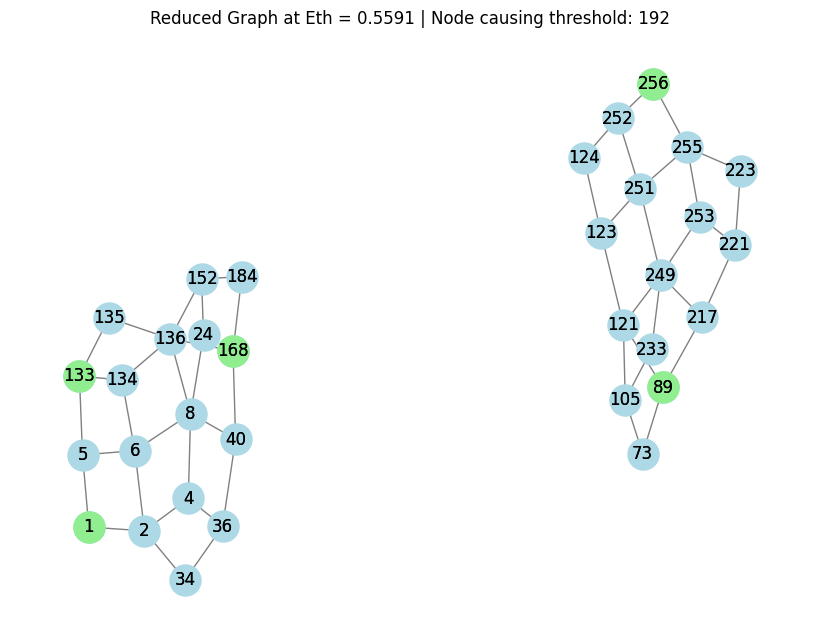

Disconnected: 168 and 256 at node 192 with energy 0.5590647705888641, DISTANCE is 0.5590647705888641


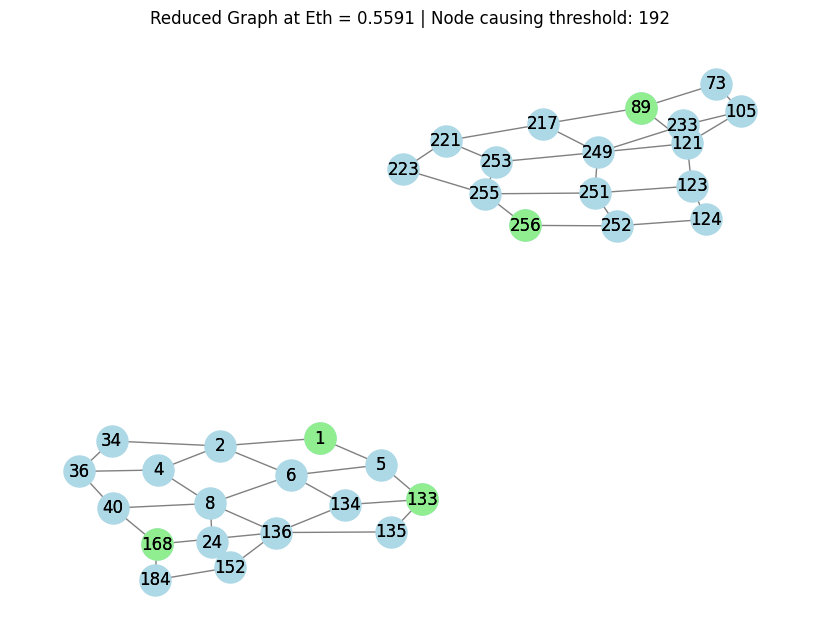

Disconnected: 89 and 256 at node 249 with energy 0.4124004168276705, DISTANCE is 0.4124004168276705


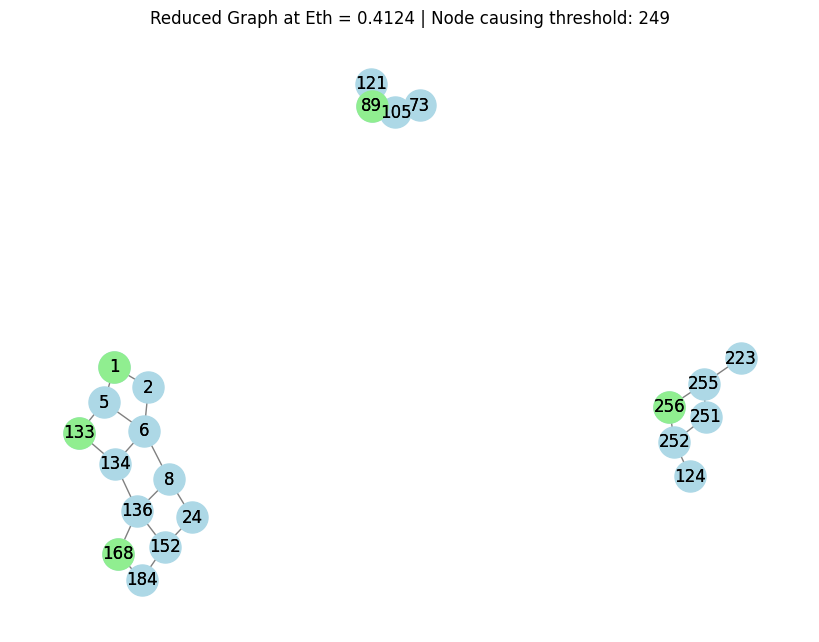

Disconnected: 1 and 168 at node 134 with energy 0.33303934871787744, DISTANCE is 0.33303934871787744


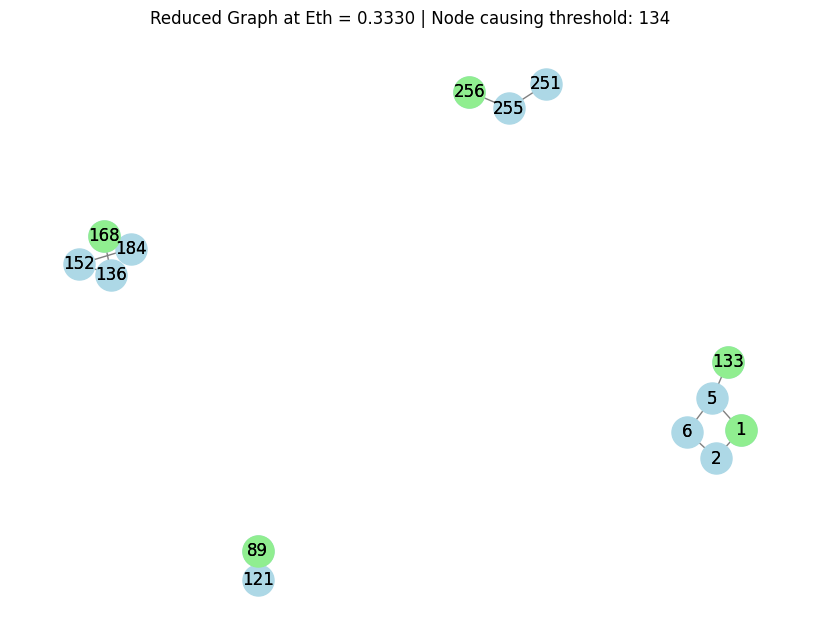

Disconnected: 133 and 168 at node 134 with energy 0.33303934871787744, DISTANCE is 0.33303934871787744


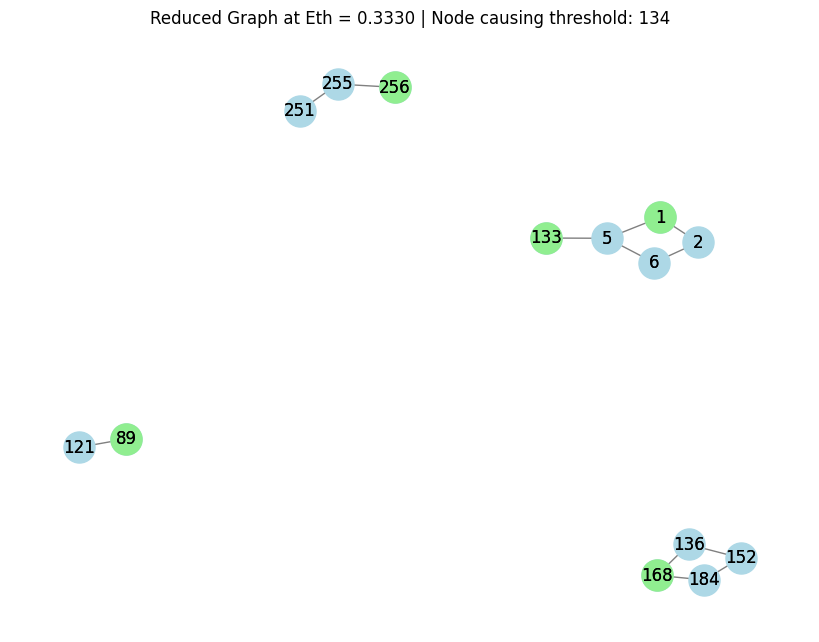

Disconnected: 1 and 133 at node 5 with energy 0.3193936142654745, DISTANCE is 0.3193936142654745


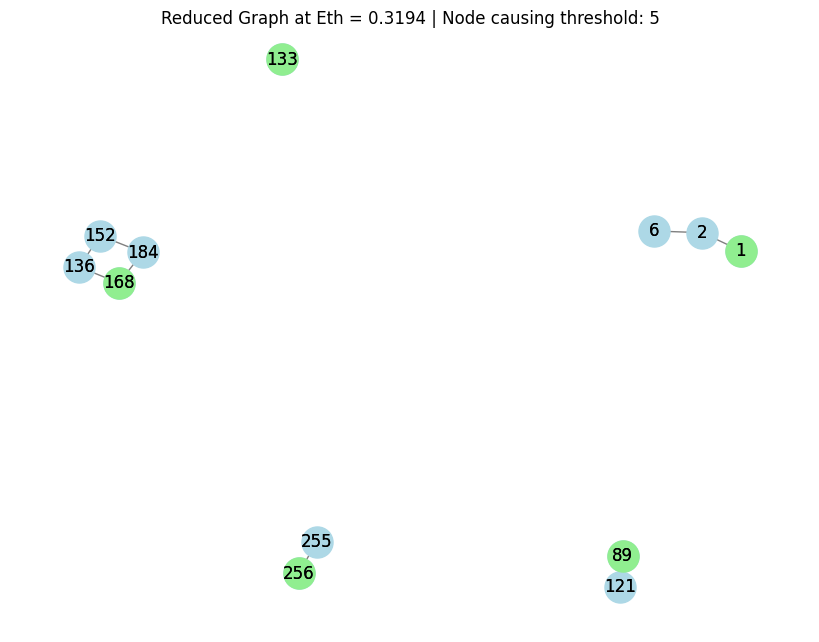

Disconnected: 1 and 105 at node 9 with energy 0.7332559960872223, DISTANCE is 0.7332559960872223


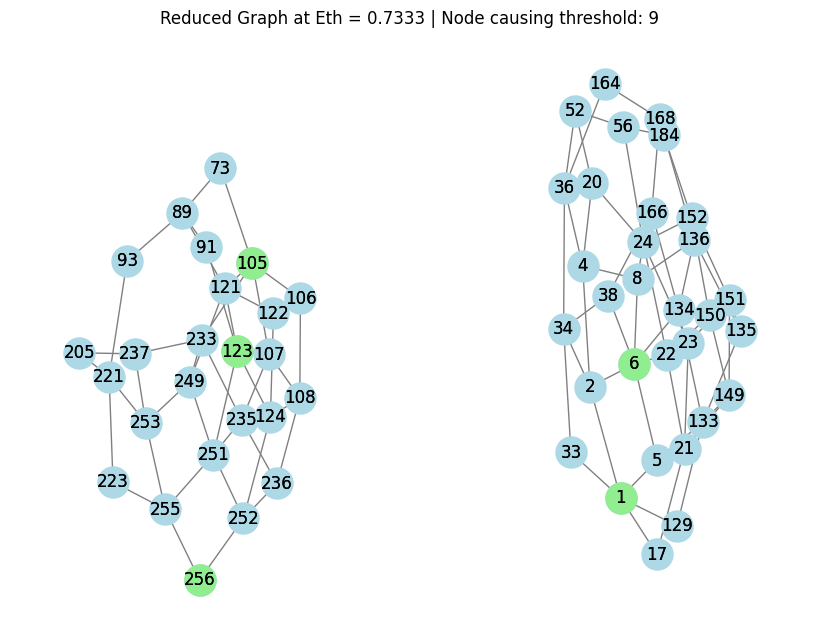

Disconnected: 1 and 123 at node 9 with energy 0.7332559960872223, DISTANCE is 0.7332559960872223


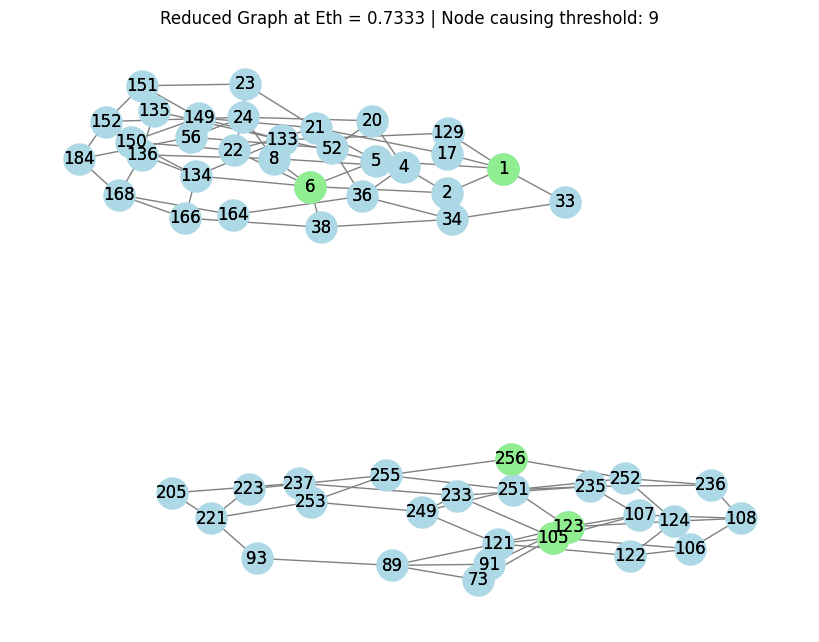

Disconnected: 1 and 256 at node 9 with energy 0.7332559960872223, DISTANCE is 0.7332559960872223


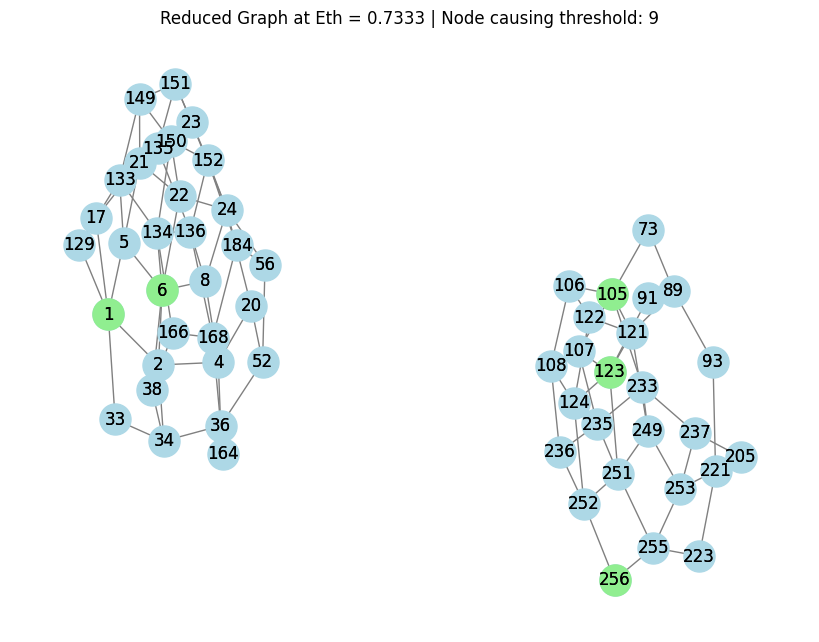

Disconnected: 6 and 105 at node 9 with energy 0.7332559960872223, DISTANCE is 0.7332559960872223


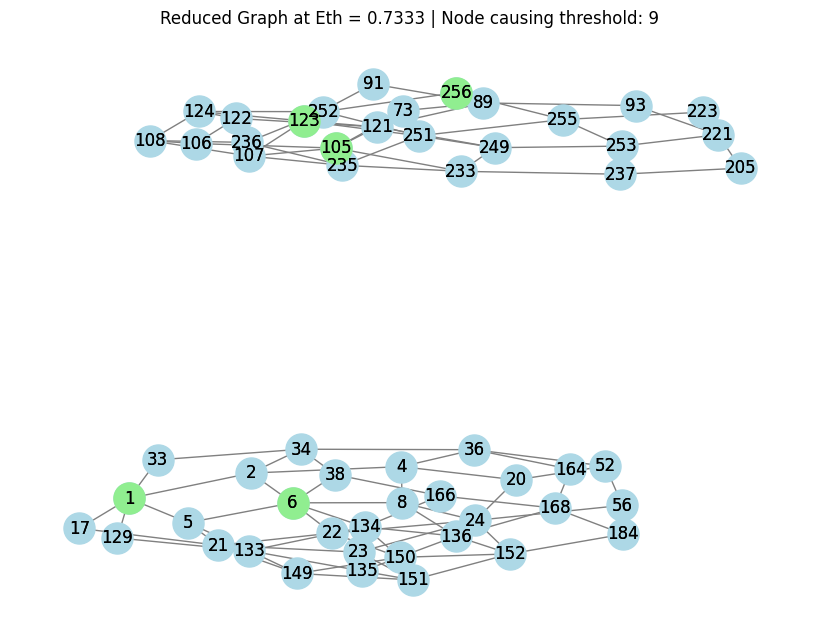

Disconnected: 6 and 123 at node 9 with energy 0.7332559960872223, DISTANCE is 0.7332559960872223


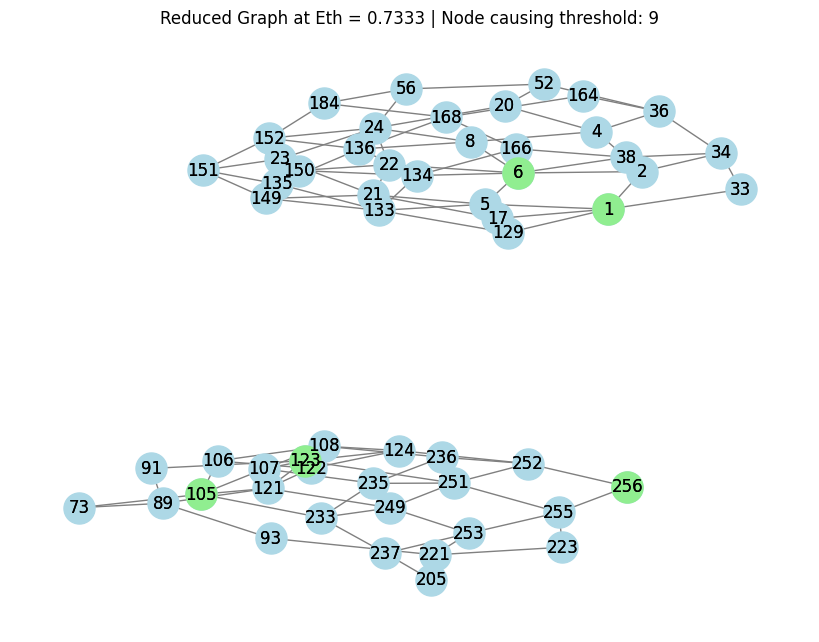

Disconnected: 6 and 256 at node 9 with energy 0.7332559960872223, DISTANCE is 0.7332559960872223


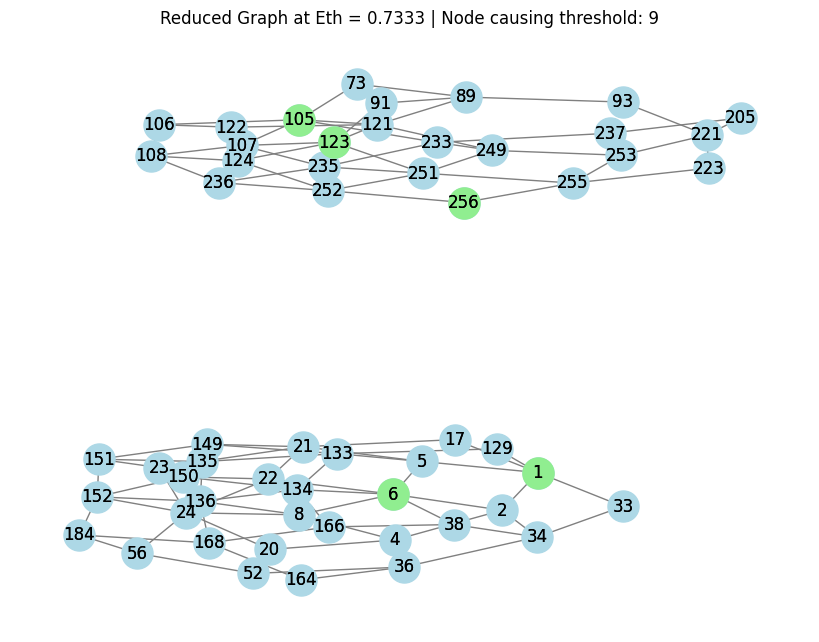

Disconnected: 105 and 256 at node 252 with energy 0.11113192096880198, DISTANCE is 0.11113192096880198


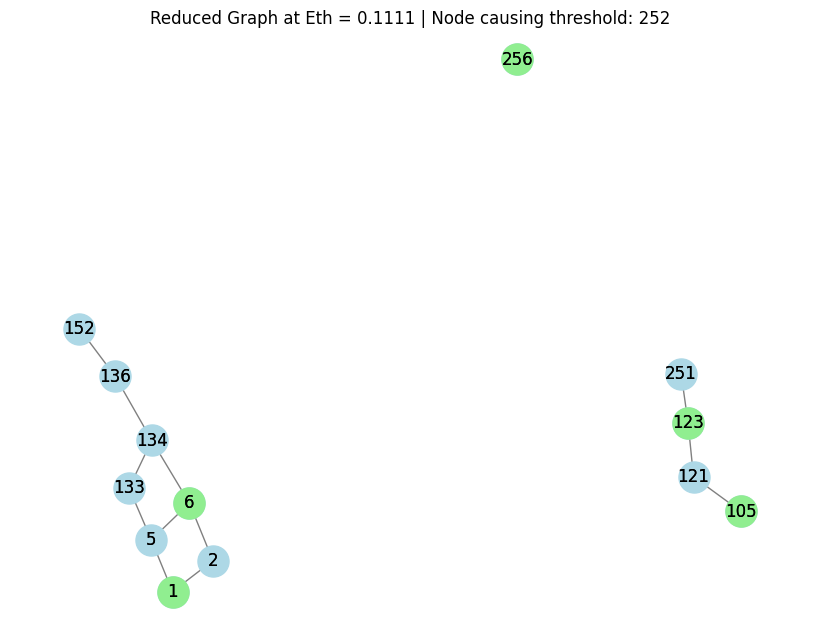

Disconnected: 123 and 256 at node 252 with energy 0.11113192096880198, DISTANCE is 0.11113192096880198


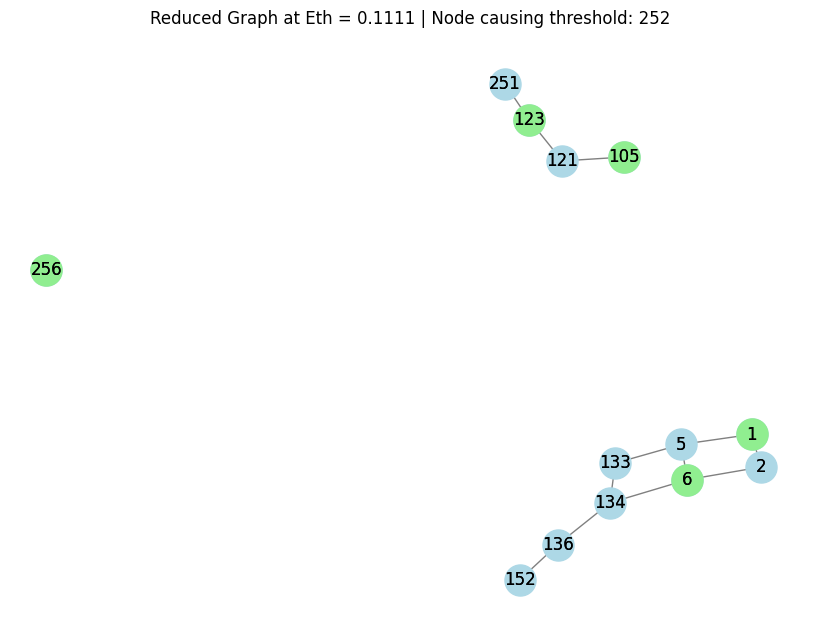

Disconnected: 1 and 6 at node 5 with energy 0.019870254361230293, DISTANCE is 0.019870254361230293


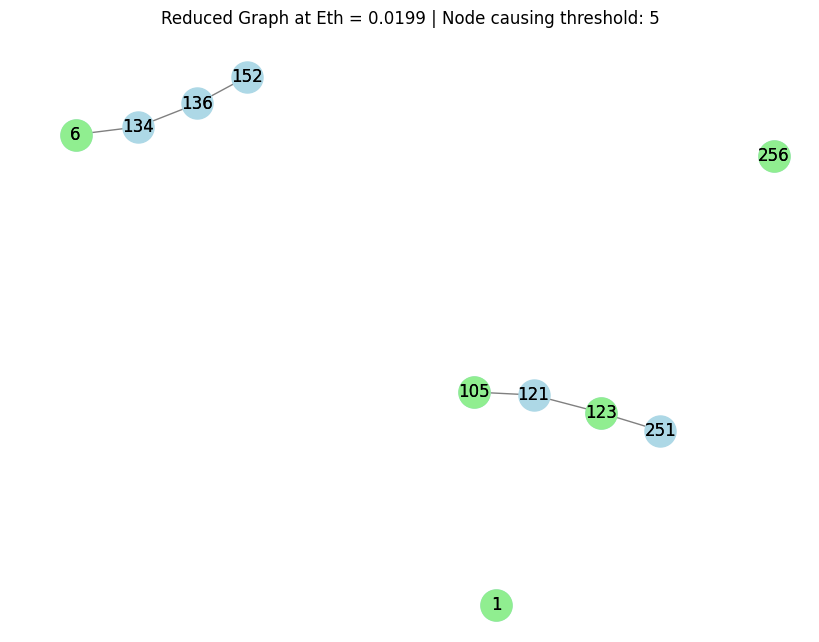

Disconnected: 105 and 123 at node 121 with energy -0.020336807101374532, DISTANCE is -0.020336807101374532


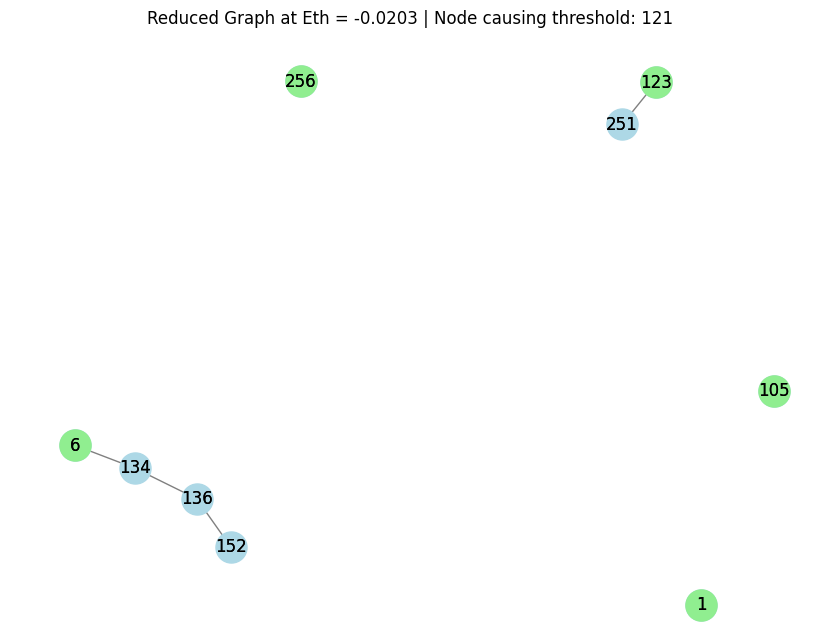

In [487]:
disconnection_events, distance, condensed_distances = build_disconnectivity_graph(G, NODES,LM, RUN_number, 'Total subjects')


disconnection_events_LATCHER, distance_LATCHER , condensed_distancesـLATCHER =  build_disconnectivity_graph(G_LATCHER, NODES_LATCHER, LM_LATCHER, RUN_number, 'Latchers')


disconnection_events_EXPLORER, distance_EXPLORER, condensed_distances_EXPLORER = build_disconnectivity_graph(G_EXPLORER, NODES_EXPLORER,LM_EXPLORER , RUN_number, 'Explorers')




In [488]:
for i in LM:

  print(i, NODES[i][1])

1 -0.0
121 0.15090223572361072
136 0.09321235280022888
256 0.061628486254418746


In [107]:
disconnection_events_EXPLORER

{(1, 73): 0.8166194809318832,
 (1, 121): 0.8166194809318832,
 (1, 184): 0.8166194809318832,
 (1, 256): 0.8166194809318832,
 (73, 184): 0.800849501018873,
 (121, 184): 0.800849501018873,
 (184, 256): 0.800849501018873,
 (73, 121): 0.7699705918281579,
 (73, 256): 0.7699705918281579,
 (121, 256): 0.7008917964726145}

In [527]:
LM

[1, 73, 136, 184, 256]

In [528]:
LM_LATCHER

[1, 73, 121, 136, 184, 256]

In [529]:
LM_EXPLORER

[1, 89, 184, 256]

In [530]:
disconnection_events

{(1, 73): 0.780513635254141,
 (1, 256): 0.780513635254141,
 (73, 136): 0.34586393256843107,
 (73, 184): 0.3521848067068746,
 (136, 256): 0.6644832240222264,
 (184, 256): 0.6644832240222264,
 (73, 256): 0.4868619855209255,
 (1, 136): 0.5271182298877064,
 (1, 184): 0.5271182298877064,
 (136, 184): 0.03795184125942708}

In [531]:
for i in LM_LATCHER:

  print(i, NODES_LATCHER[i][1])

1 -0.0
73 0.467295848037965
121 0.5211633532197695
136 0.3883435917116942
184 0.3995926532345222
256 0.0938227550331856


In [532]:
for i in LM_EXPLORER:
  print(i, NODES_EXPLORER[i][1])

1 -0.0
89 0.44662849574857777
184 0.46173174352715485
256 0.1454250113699871


/usr/local/lib/python3.10/dist-packages/scipy/cluster/hierarchy.py:2818: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.set_ylim([0, dvw])


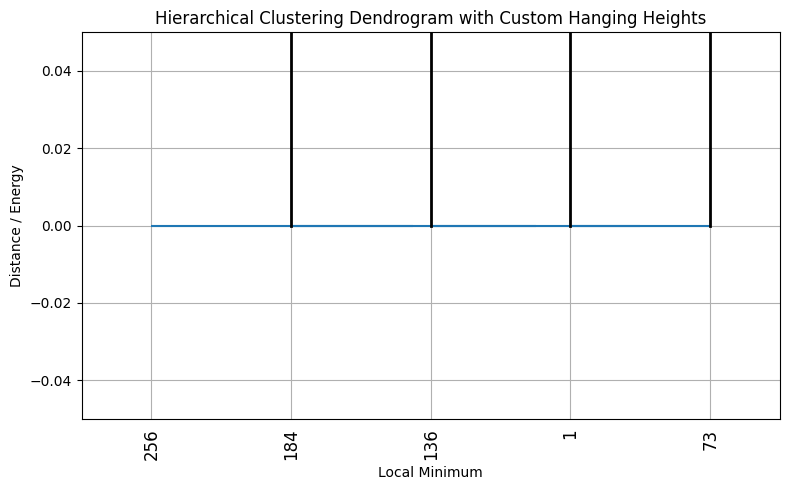

In [533]:
import numpy as np
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt
from scipy.spatial import distance

# Assuming LM and LM_ENERGY are defined as in your previous code
# List of features (LM)
features = LM  # e.g., [1, 73, 184, 256]
num_features = len(features)

# Create a distance matrix
distance_matrix = np.zeros((num_features, num_features))

# Map feature indices to positions in the distance matrix
feature_index = {feature: idx for idx, feature in enumerate(features)}

# Fill the distance matrix using the values from the dictionary
# for (f1, f2), distance_value in distance_dict.items():
#     idx1, idx2 = feature_index[f1], feature_index[f2]
#     distance_matrix[idx1, idx2] = distance_value
#     distance_matrix[idx2, idx1] = distance_value  # Make it symmetric

# Convert to condensed form for linkage function
condensed_distances = distance.squareform(distance_matrix)

# Perform hierarchical clustering
Z = sch.linkage(condensed_distances, method='average')

# List of LM_ENERGY corresponding to the features (LM)
LM_ENERGY = [NODES[i][1] for i in LM]

# Plot the dendrogram with custom hanging heights
plt.figure(figsize=(8, 5))

# Define a custom function to set leaf heights
def custom_dendrogram(*args, **kwargs):
    ddata = sch.dendrogram(*args, **kwargs)

    # Set custom leaf heights based on LM_ENERGY
    ax = plt.gca()
    for i, d in zip(ax.get_xticks(), LM_ENERGY):
        ax.plot([i, i], [0, d], 'k-', lw=2)  # Vertical lines from 0 to LM_ENERGY
    return ddata

# Plot the custom dendrogram
custom_dendrogram(Z, labels=[str(f) for f in features], leaf_rotation=90)

plt.title("Hierarchical Clustering Dendrogram with Custom Hanging Heights")
plt.xlabel("Local Minimum")
plt.ylabel("Distance / Energy")
plt.grid(True)
plt.tight_layout()
plt.show()


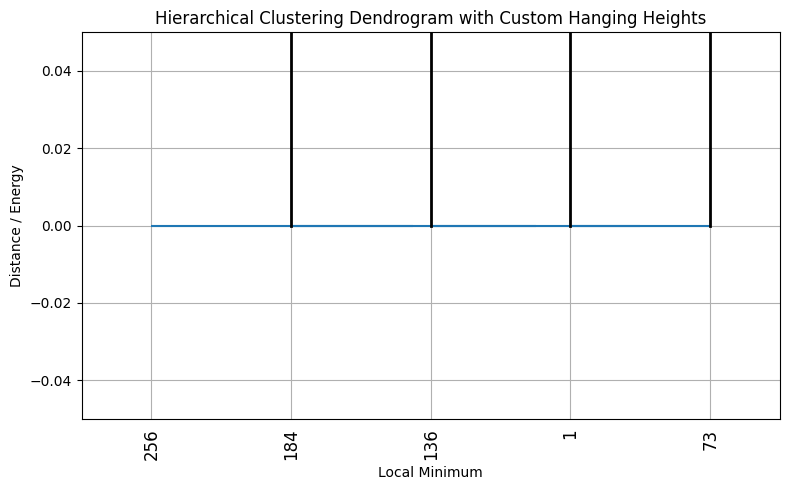

In [534]:
import numpy as np
import scipy.cluster.hierarchy as sch
from scipy.spatial import distance
import matplotlib.pyplot as plt

# Assuming LM and LM_ENERGY are defined as in your previous code
# List of features (LM)
features = LM  # e.g., [1, 73, 184, 256]
num_features = len(features)

# Create a distance matrix
distance_matrix = np.zeros((num_features, num_features))

# Map feature indices to positions in the distance matrix
feature_index = {feature: idx for idx, feature in enumerate(features)}

# Fill the distance matrix using the values from the dictionary
# for (f1, f2), distance_value in distance_dict.items():
#     idx1, idx2 = feature_index[f1], feature_index[f2]
#     distance_matrix[idx1, idx2] = distance_value
#     distance_matrix[idx2, idx1] = distance_value  # Make it symmetric

# Check for negative values
if np.any(distance_matrix < 0):
    print("Warning: Negative distances found in the distance matrix.")
    # Option 1: Take absolute value of distances (if it makes sense in your case)
    distance_matrix = np.abs(distance_matrix)
    # Option 2: Raise an error to investigate further
    # raise ValueError("Distance matrix contains negative distances.")

# Convert to condensed form for linkage function
condensed_distances = distance.squareform(distance_matrix)

# Perform hierarchical clustering
Z = sch.linkage(condensed_distances, method='average')

# List of LM_ENERGY corresponding to the features (LM)
LM_ENERGY = [NODES[i][1] for i in LM]

# Plot the dendrogram with custom hanging heights
plt.figure(figsize=(8, 5))

# Define a custom function to set leaf heights
def custom_dendrogram(*args, **kwargs):
    ddata = sch.dendrogram(*args, **kwargs)

    # Set custom leaf heights based on LM_ENERGY
    ax = plt.gca()
    for i, d in zip(ax.get_xticks(), LM_ENERGY):
        ax.plot([i, i], [0, d], 'k-', lw=2)  # Vertical lines from 0 to LM_ENERGY
    return ddata

# Plot the custom dendrogram
custom_dendrogram(Z, labels=[str(f) for f in features], leaf_rotation=90)

plt.title("Hierarchical Clustering Dendrogram with Custom Hanging Heights")
plt.xlabel("Local Minimum")
plt.ylabel("Distance / Energy")
plt.grid(True)
plt.tight_layout()
plt.show()


In [535]:

# disconnection_events2

In [536]:
NODES[1]

[[0, 0, 0, 0, 0, 0, 0, 0], -0.0]

In [537]:

NODES[256]

[[1, 1, 1, 1, 1, 1, 1, 1], 0.1160304112319146]

In [538]:
NODES[73]

[[0, 1, 0, 0, 1, 0, 0, 0], 0.4811963002071138]

In [539]:
min(NODES[1][1],NODES[256][1])

-0.0

In [540]:
NODES[184]

[[1, 0, 1, 1, 0, 1, 1, 1], 0.4283288285472664]

In [541]:
NODES[256]

[[1, 1, 1, 1, 1, 1, 1, 1], 0.1160304112319146]

<ipython-input-542-e86510bd9208>:16: ClusterWarning: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage_matrix = sch.linkage(distance_matrix, method='average')


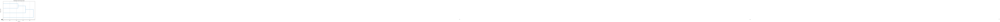

In [542]:
import numpy as np
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt

# Sample data
features = ['feature1', 'feature2', 'feature3', 'feature4']
energy_values = np.array([1.184, 0.256, 0.512, 0.768])  # Energy values for each feature

# Example distance matrix (must be condensed)
distance_matrix = np.array([[0.0, 0.5, 0.6, 0.7],
                             [0.5, 0.0, 0.4, 0.5],
                             [0.6, 0.4, 0.0, 0.3],
                             [0.7, 0.5, 0.3, 0.0]])  # Symmetric matrix

# Perform hierarchical clustering
linkage_matrix = sch.linkage(distance_matrix, method='average')

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the dendrogram
dendrogram_data = sch.dendrogram(linkage_matrix, labels=features, orientation='right', ax=ax, color_threshold=0)

# Adjust the heights of the lines based on energy values
for i, (icoord, dcoord) in enumerate(zip(dendrogram_data['icoord'], dendrogram_data['dcoord'])):
    x = np.mean(icoord[1:3])  # x position in dendrogram
    energy_height = energy_values[i]  # Use energy value for height

    # Draw line from the current height to the energy height
    ax.plot([x, x], [dcoord[1], energy_height], color='black', linewidth=1)

    # Annotate the energy value
    ax.text(x, energy_height, f"{energy_height:.2f}", va='bottom', ha='center', fontsize=8)

# Customize the plot
ax.set_title('Dendrogram with Energy Values')
ax.set_xlabel('Features')
ax.set_ylabel('Energy Levels')
ax.grid(True)

# Set y-ticks to the energy values
ax.set_yticks(energy_values)
ax.set_yticklabels([f"{e:.2f}" for e in energy_values])

plt.show()

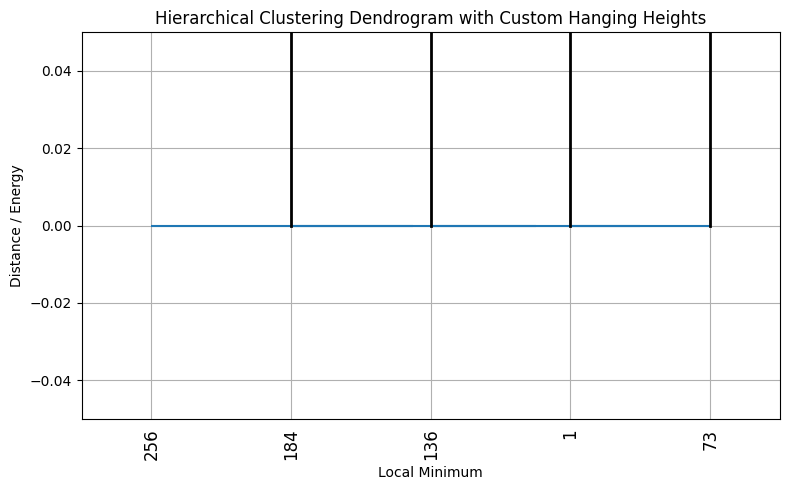

In [543]:
import numpy as np
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt
from scipy.spatial import distance

# Assuming LM and LM_ENERGY are defined as in your previous code
# List of features (LM)
features = LM  # e.g., [1, 73, 184, 256]
num_features = len(features)

# Create a distance matrix
distance_matrix = np.zeros((num_features, num_features))

# Map feature indices to positions in the distance matrix
feature_index = {feature: idx for idx, feature in enumerate(features)}

# Fill the distance matrix using the values from the dictionary
# for (f1, f2), distance_value in distance_dict.items():
#     idx1, idx2 = feature_index[f1], feature_index[f2]
#     distance_matrix[idx1, idx2] = distance_value
#     distance_matrix[idx2, idx1] = distance_value  # Make it symmetric

# Convert to condensed form for linkage function
condensed_distances = distance.squareform(distance_matrix)

# Perform hierarchical clustering
Z = sch.linkage(condensed_distances, method='average')

# List of LM_ENERGY corresponding to the features (LM)
LM_ENERGY = [NODES[i][1] for i in LM]

# Plot the dendrogram with custom hanging heights
plt.figure(figsize=(8, 5))

# Define a custom function to set leaf heights
def custom_dendrogram(*args, **kwargs):
    ddata = sch.dendrogram(*args, **kwargs)

    # Set custom leaf heights based on LM_ENERGY
    ax = plt.gca()
    for i, d in zip(ax.get_xticks(), LM_ENERGY):
        ax.plot([i, i], [0, d], 'k-', lw=2)  # Vertical lines from 0 to LM_ENERGY
    return ddata

# Plot the custom dendrogram
custom_dendrogram(Z, labels=[str(f) for f in features], leaf_rotation=90)

plt.title("Hierarchical Clustering Dendrogram with Custom Hanging Heights")
plt.xlabel("Local Minimum")
plt.ylabel("Distance / Energy")
plt.grid(True)
plt.tight_layout()
plt.show()
